## LIBRERÍAS

In [52]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import spotipy
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import pickle

from scipy.stats import shapiro
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from spotipy.oauth2 import SpotifyClientCredentials # para el acceso

# guardo en variable para facilitar acceso y uso
clientID = 'ID'
clientSecret = 'secret'

# Authentication
client_credential_manager = SpotifyClientCredentials(client_id=clientID, client_secret=clientSecret)
sp = spotipy.Spotify(client_credentials_manager=client_credential_manager)

## DATASET
Con géneros y followers ya.

In [4]:
df = pd.read_csv("/Users/gabrielarodrigocastrillo/Desktop/The_Bridge/Data_Science/COPIA_Repositorio/03-Machine_Learning/Proyecto_ML/SRC/data/raw_files/raw_data.csv")
df

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
0,2022-11-25T11:45:12Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273a935e4...,Unholy (feat. Kim Petras),2022-09-22,1,2wY79sveU1sp5g7SokKOiI,Sam Smith,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",156.943,False,3nqQXoyQOWXiESFLlDF1hG,Unholy (feat. Kim Petras),100,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.714,0.472,0.0864,0.01300,0.000005,0.2660,0.238,-7.384,131.007,0.358,4,1.000,2,0.485,1,0.416,"['pop', 'uk pop']",21931185
1,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273bb54dd...,Midnights,2022-10-21,13,06HL4z0CvFAxyc27GXpf02,Taylor Swift,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",200.690,False,0V3wPSX9ygBnCm8psDIegu,Anti-Hero,97,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.637,0.643,0.0519,0.13000,0.000002,0.1420,0.533,-6.645,96.888,0.102,4,1.000,4,0.073,1,0.267,['pop'],68732645
2,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b27302854a...,Her Loss,2022-11-04,16,3TVXtAsR1Inumwj472S9r4,Drake,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",239.359,True,1bDbXMyjaUIooNwFE9wn0N,Rich Flex,95,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.561,0.520,0.2440,0.05030,0.000002,0.3550,0.424,-9.390,160.070,0.204,4,0.954,4,0.000,0,0.041,"['canadian hip hop', 'canadian pop', 'hip hop'...",72390794
3,2022-11-25T11:45:12Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273c9f744...,La Bachata,2022-05-26,1,0tmwSHipWxN12fsoLcFU3B,Manuel Turizo,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",162.637,False,5ww2BF9slyYgNOk37BlC4u,La Bachata,97,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.835,0.679,0.0364,0.58300,0.000002,0.2180,0.850,-5.329,124.980,0.877,4,1.000,7,0.588,0,0.485,"['colombian pop', 'latin pop', 'reggaeton', 'r...",11583371
4,2022-11-25T11:45:12Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273933c03...,I'm Good (Blue),2022-08-26,2,1Cs0zKBU1kc0i8ypK3B9ai,David Guetta,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",175.238,True,4uUG5RXrOk84mYEfFvj3cK,I'm Good (Blue),97,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.561,0.965,0.0343,0.00383,0.000007,0.3710,0.304,-3.673,128.040,0.808,4,0.789,7,0.898,0,0.773,"['big room', 'dance pop', 'edm', 'pop', 'pop d...",25592264
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1462,2022-11-25T11:45:20Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273584941...,Thức Giấc,2021-07-14,1,6zUWZmyi5MLOEynQ5wCI5f,Da LAB,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",269.021,False,1MiJk3dXC5jzhvLFP0dUM7,Thức Giấc,59,https://open.spotify.com/playlist/37i9dQZEVXbK...,vietnam,0.660,0.578,0.0306,0.45000,0.000089,0.1030,0.190,-8.591,127.092,0.713,4,1.000,9,0.286,1,0.427,"['indie viet', 'v-pop', 'vietnamese hip hop']",839402
1463,2022-11-25T11:45:20Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b2732a8efe...,Đi Về Nhà,2020-12-20,1,1LEtM3AleYg1xabW6CRkpi,Đen,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",200.000,False,7LVrrX8pkzI9fMF88nGabt,Đi Về Nhà,59,https://open.spotify.com/playlist/37i9dQZEVXbK...,vietnam,0.742,0.662,0.0647,0.57800,0.000000,0.1260,0.486,-4.651,84.006,0.004,4,1.000,5,0.315,1,0.364,"['indie vi

## TRAIN Y TEST
Decido que las de texto van fuera. Conservo categórigas que puedo transformar fácil.    
Todos los identificadores, así como links, fechas, imágenes y paja, también fuera.   
Las numéricas, deiferentes formas.

In [5]:
X = df.copy()
X = X[['album_type','album_total_tracks','track_duration','explicit','popularity','country','danceability',
       'energy','speechiness','acousticness','instrumentalness','liveness','valence','loudness','tempo','tempo_confidence','time_signature',
       'time_signature_confidence','key','key_confidence','mode','mode_confidence','artist_followers']]

X_train, X_test = train_test_split(X,test_size=0.2,random_state=42)
X_train.shape, X_test.shape

((1173, 23), (294, 23))

In [6]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1173 entries, 654 to 1126
Data columns (total 23 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   album_type                 1173 non-null   object 
 1   album_total_tracks         1173 non-null   int64  
 2   track_duration             1173 non-null   float64
 3   explicit                   1173 non-null   bool   
 4   popularity                 1173 non-null   int64  
 5   country                    1173 non-null   object 
 6   danceability               1173 non-null   float64
 7   energy                     1173 non-null   float64
 8   speechiness                1173 non-null   float64
 9   acousticness               1173 non-null   float64
 10  instrumentalness           1173 non-null   float64
 11  liveness                   1173 non-null   float64
 12  valence                    1173 non-null   float64
 13  loudness                   1173 non-null   flo

In [6]:
X_train.describe()

,album_total_tracks,track_duration,popularity,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers
count,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1173.000000,1.173000e+03
mean,7.145780,198.943991,68.887468,0.682203,0.634209,0.108899,0.295681,0.017481,0.172452,0.525442,-6.881324,123.161782,0.463448,3.954817,0.932823,5.501279,0.471688,0.554135,0.510314,5.511299e+06
std,8.936736,52.183827,11.743750,0.140443,0.166531,0.099446,0.256225,0.098974,0.133918,0.218946,2.637394,28.442076,0.286221,0.290059,0.147622,3.527228,0.224614,0.497273,0.161205,1.535780e+07
min,1.000000,76.460000,8.000000,0.210000,0.034900,0.023000,0.000047,0.000000,0.021700,0.037400,-26.813000,60.001000,0.000000,1.000000,0.071000,0.000000,0.000000,0.000000,0.000000,9.000000e+01
25%,1.000000,165.230000,59.000000,0.587000,0.525000,0.041300,0.079900,0.000000,0.096200,0.345000,-8.192000,99.970000,0.213000,4.000000,0.944000,2.000000,0.328000,0.000000,0.413000,1.221760e+05
50%,2.000000,191.964000,69.000000,0.698000,0.649000,0.067300,0.214000,0.000001,0.119000,0.528000,-6.614000,120.048000,0.446000,4.000000,1.000000,6.000000,0.492000,1.000000,0.528000,5.158510e+05
75%,13.000000,223.107000,78.000000,0.787000,0.752000,0.142000,0.460000,0.000091,0.195000,0.684000,-5.124000,140.018000,0.724000,4.000000,1.000000,8.000000,0.626000,1.000000,0.619000,2.188898e+06
max,130.000000,628.124000,100.000000,0.955000,0.996000,0.862000,0.972000,0.920000,0.939000,0.972000,-0.484000,211.997000,1.000000,5.000000,1.000000,11.000000,1.000000,1.000000,1.000000,1.100477e+08


## TRANSFORMACIÓN VARIABLES
### Categóricas

In [7]:
X_train.album_type.value_counts(normalize=True)

single         0.572038
album          0.422847
compilation    0.005115
Name: album_type, dtype: float64

In [8]:
# One hot col album_type
X_train = pd.get_dummies(X_train, columns = ["album_type"], prefix = ["al_type"])
X_train.drop(columns=("al_type_album"),axis=1, inplace=True) #correlación

In [9]:
X_train.explicit.value_counts(normalize=True)

False    0.693095
True     0.306905
Name: explicit, dtype: float64

In [10]:
# Tratamos col explicit
X_train = pd.get_dummies(X_train, columns = ["explicit"], prefix = ["exp"])
X_train.drop(columns=("exp_True"),axis=1, inplace=True) # eliminamos por correlación

In [11]:
X_train.columns

Index(['album_total_tracks', 'track_duration', 'popularity', 'country',
       'danceability', 'energy', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'loudness', 'tempo',
       'tempo_confidence', 'time_signature', 'time_signature_confidence',
       'key', 'key_confidence', 'mode', 'mode_confidence', 'artist_followers',
       'al_type_compilation', 'al_type_single', 'exp_False'],
      dtype='object')

## *CORRELACIÓN*
Antes de hacer nada con las numéricas, para comparar

/var/folders/8w/q_1f6d1519b6rp401yzhh8v40000gn/T/ipykernel_2494/515074565.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(X_train.corr(), ax=ax, cmap="YlGnBu");


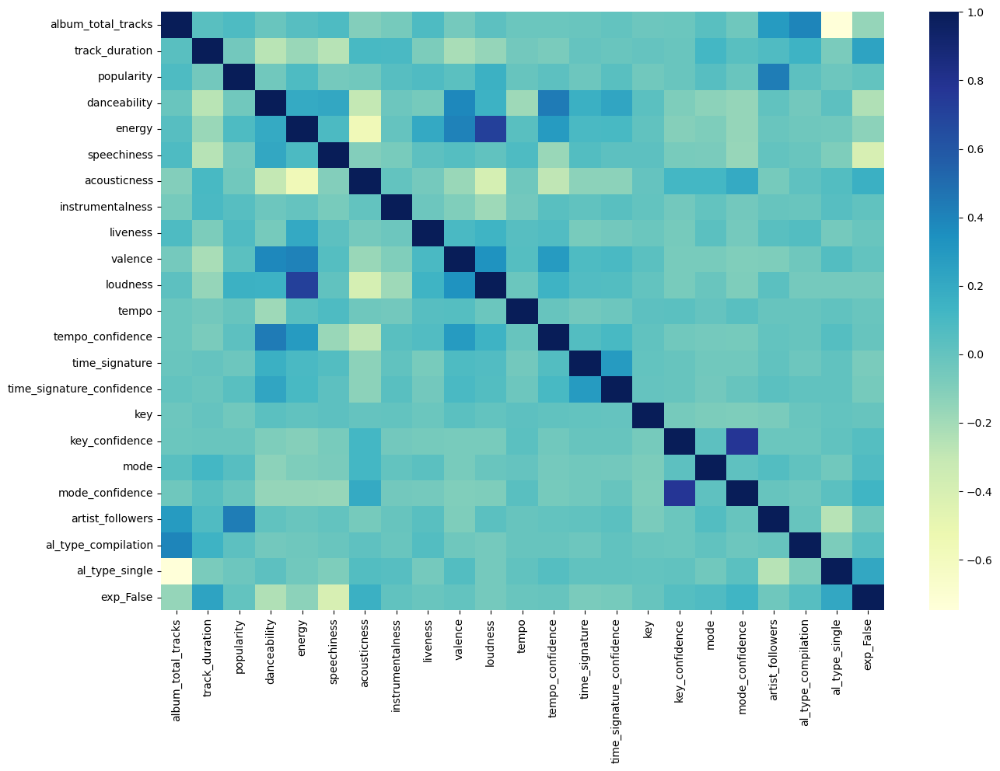

In [12]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
sns.heatmap(X_train.corr(), ax=ax, cmap="YlGnBu");

/var/folders/8w/q_1f6d1519b6rp401yzhh8v40000gn/T/ipykernel_2494/106981090.py:2: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_cv1 = pd.DataFrame(X_train.std() / X_train.mean().abs(), columns=['CV'])
/var/folders/8w/q_1f6d1519b6rp401yzhh8v40000gn/T/ipykernel_2494/106981090.py:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_cv1 = pd.DataFrame(X_train.std() / X_train.mean().abs(), columns=['CV'])


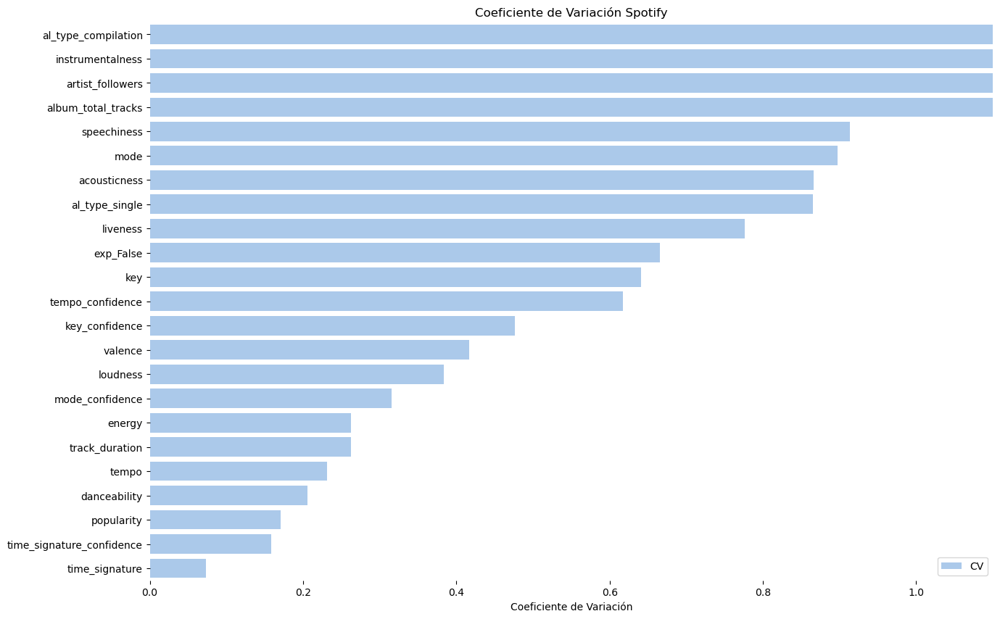

In [13]:
# Cálculo de los coeficientes de variación
df_cv1 = pd.DataFrame(X_train.std() / X_train.mean().abs(), columns=['CV'])
df_cv1 = df_cv1.reset_index().sort_values(by='CV', ascending=False)

# Representación del coeficiente de variación Mobile Data
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
sns.set_color_codes("pastel")
sns.barplot(y='index', x="CV", data=df_cv1,
            label="CV", color="b");

ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(0, 1.1), ylabel="",
       xlabel="Coeficiente de Variación", title="Coeficiente de Variación Spotify")
sns.despine(left=True, bottom=True);

### Numéricas
La col 'album_total_tracks' = 'album_type', así que fuera. Además, distribución raruna.  
Me quedo sólo con las ransformaciones que mejoran.

ShapiroResult(statistic=0.6426441669464111, pvalue=5.044674471569341e-44)

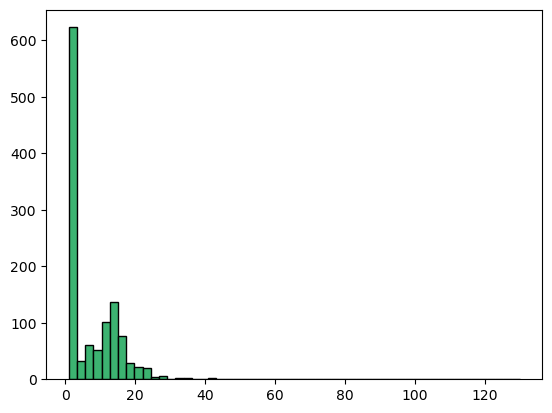

In [14]:
plt.hist(X_train["album_total_tracks"], color="mediumseagreen", edgecolor="black", bins=55);
#distribución malita - log?
shapiro(X_train.album_total_tracks) 

ShapiroResult(statistic=0.9081231355667114, pvalue=5.318891571964761e-26)

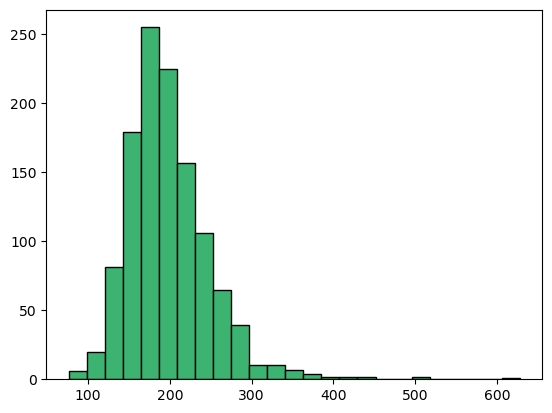

In [15]:
plt.hist(X_train["track_duration"],color="mediumseagreen", edgecolor="black", bins=25);
#no es normal del todo, pero no muy mala pinta
shapiro(X_train.track_duration) 

ShapiroResult(statistic=0.9907163977622986, pvalue=9.338889412902063e-07)

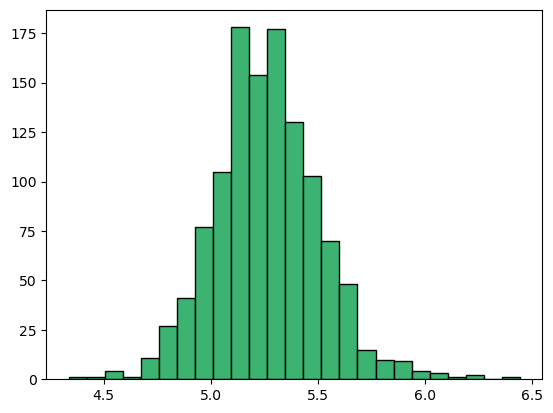

In [16]:
# Transformación logarítmica
track_dur_log = np.log(X_train.track_duration)
plt.hist(track_dur_log, color="mediumseagreen", edgecolor="black", bins=25);
shapiro(track_dur_log) 

In [17]:
X_train = X_train.assign(track_dur_log=track_dur_log)

ShapiroResult(statistic=0.7654281854629517, pvalue=6.628421435429864e-38)

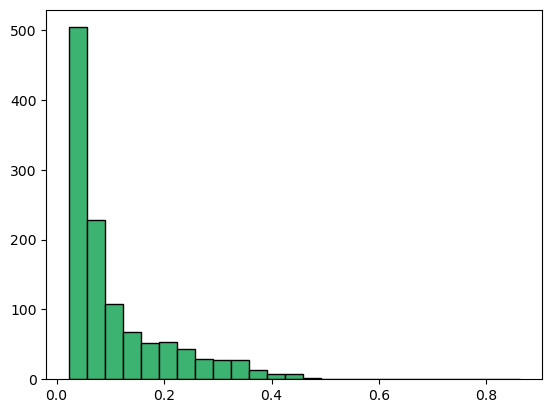

In [18]:
plt.hist(X_train['speechiness'], color="mediumseagreen", edgecolor="black", bins=25);
#transformar?
shapiro(X_train.speechiness) 

ShapiroResult(statistic=0.9389746189117432, pvalue=1.5318573111947291e-21)

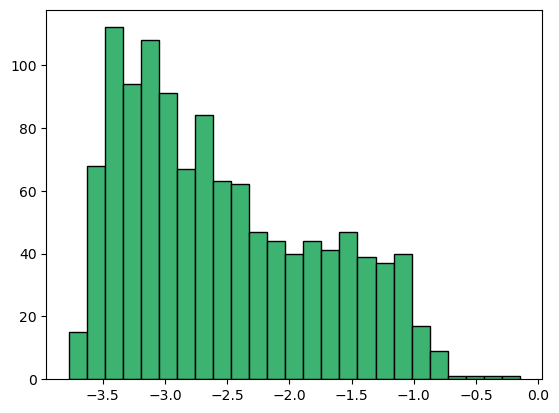

In [19]:
# Transformación logarítmica
speech_log = np.log(X_train.speechiness)
plt.hist(speech_log, color="mediumseagreen", edgecolor="black", bins=25);
shapiro(speech_log) 

In [20]:
X_train = X_train.assign(speech_log=speech_log)

ShapiroResult(statistic=0.7236331105232239, pvalue=3.1401136767669096e-40)

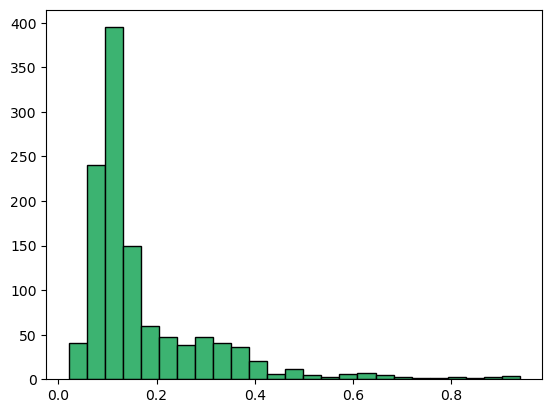

In [21]:
plt.hist(X_train['liveness'],color="mediumseagreen",edgecolor="black",bins=25);
shapiro(X_train.liveness) 

ShapiroResult(statistic=0.9479873180389404, pvalue=6.389784762569168e-20)

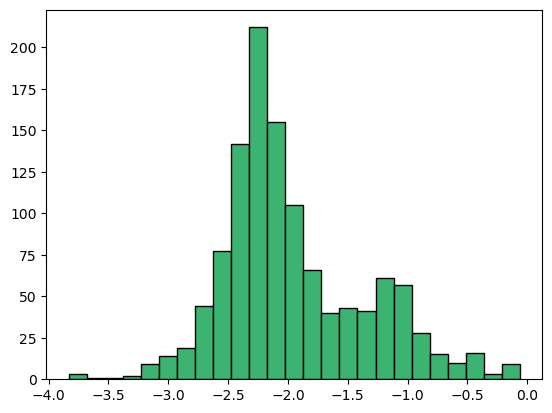

In [22]:
# Transformación logarítmica
liveness_log = np.log(X_train.liveness)
plt.hist(liveness_log,color="mediumseagreen", edgecolor="black", bins=25);

shapiro(liveness_log) 

In [23]:
X_train = X_train.assign(liveness_log=liveness_log)

ShapiroResult(statistic=0.9709830284118652, pvalue=1.3955164267546137e-14)

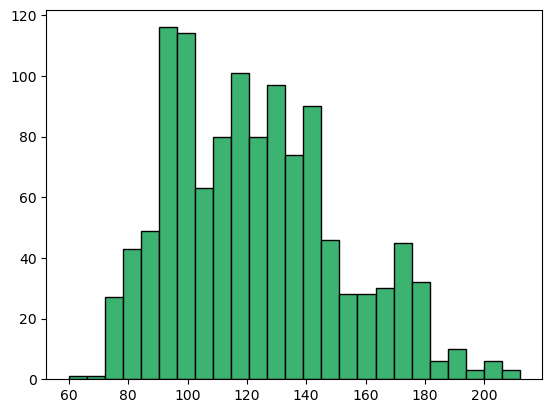

In [24]:
plt.hist(X_train['tempo'],color="mediumseagreen",edgecolor="black",bins=25);
shapiro(X_train.tempo)

ShapiroResult(statistic=0.9893611669540405, pvalue=1.6378045586407097e-07)

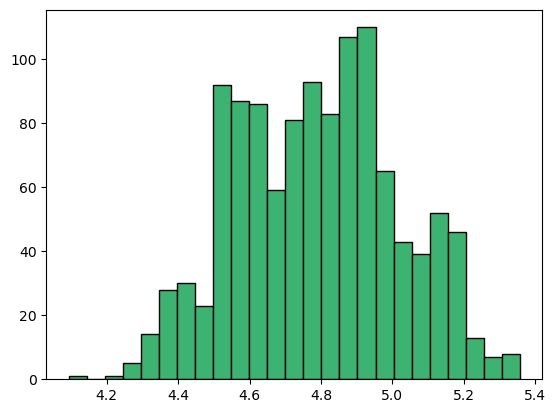

In [25]:
# Transformación logarítmica
tempo_log = np.log(X_train.tempo)
plt.hist(tempo_log,color="mediumseagreen", edgecolor="black", bins=25);

shapiro(tempo_log) 

In [26]:
X_train = X_train.assign(tempo_log=tempo_log)

In [27]:
#Tratamos col 'key'
X_train['key_oh'] = X_train['key']
X_train = pd.get_dummies(X_train, columns = ["key_oh"], prefix = ["k"])
X_train.drop(columns=("k_11"),axis=1, inplace=True) # eliminamos por correlación

In [28]:
X_train.columns

Index(['album_total_tracks', 'track_duration', 'popularity', 'country',
       'danceability', 'energy', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'loudness', 'tempo',
       'tempo_confidence', 'time_signature', 'time_signature_confidence',
       'key', 'key_confidence', 'mode', 'mode_confidence', 'artist_followers',
       'al_type_compilation', 'al_type_single', 'exp_False', 'track_dur_log',
       'speech_log', 'liveness_log', 'tempo_log', 'k_0', 'k_1', 'k_2', 'k_3',
       'k_4', 'k_5', 'k_6', 'k_7', 'k_8', 'k_9', 'k_10'],
      dtype='object')

## DATA SEGÚN PROCESAMIENTO

In [29]:
X_train_plain = X_train.copy()
X_train_plain = X_train_plain[['track_duration', 'popularity',
                                'danceability', 'energy', 'speechiness', 'acousticness',
                                'instrumentalness', 'liveness', 'valence', 'loudness', 'tempo',
                                'tempo_confidence', 'time_signature', 'time_signature_confidence',
                                'key', 'key_confidence', 'mode', 'mode_confidence', 'artist_followers',
                                'al_type_compilation', 'al_type_single', 'exp_False']]
X_train_plain.to_csv("train_set_plain.csv", index=False)

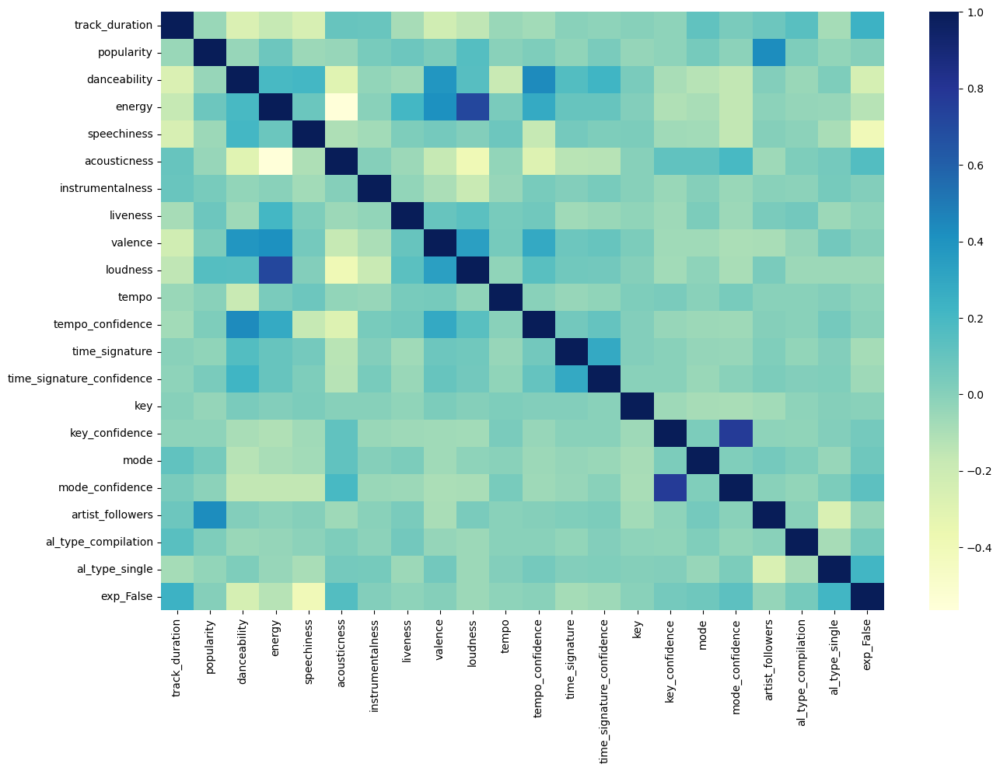

In [30]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
sns.heatmap(X_train_plain.corr(), ax=ax, cmap="YlGnBu");

In [31]:
X_train_log = X_train.copy()
X_train_log = X_train_log[['track_dur_log','popularity','danceability', 'energy','speech_log','acousticness',
                            'instrumentalness', 'liveness_log', 'valence', 'loudness','tempo_log','tempo_confidence', 'time_signature', 'time_signature_confidence',
                            'k_0', 'k_1', 'k_2', 'k_3', 'k_4', 'k_5', 'k_6', 'k_7',
                            'k_8', 'k_9', 'k_10', 'key_confidence', 'mode', 'mode_confidence', 'artist_followers',
                            'al_type_compilation', 'al_type_single', 'exp_False']]
X_train_log.to_csv("train_set_log.csv", index=False)

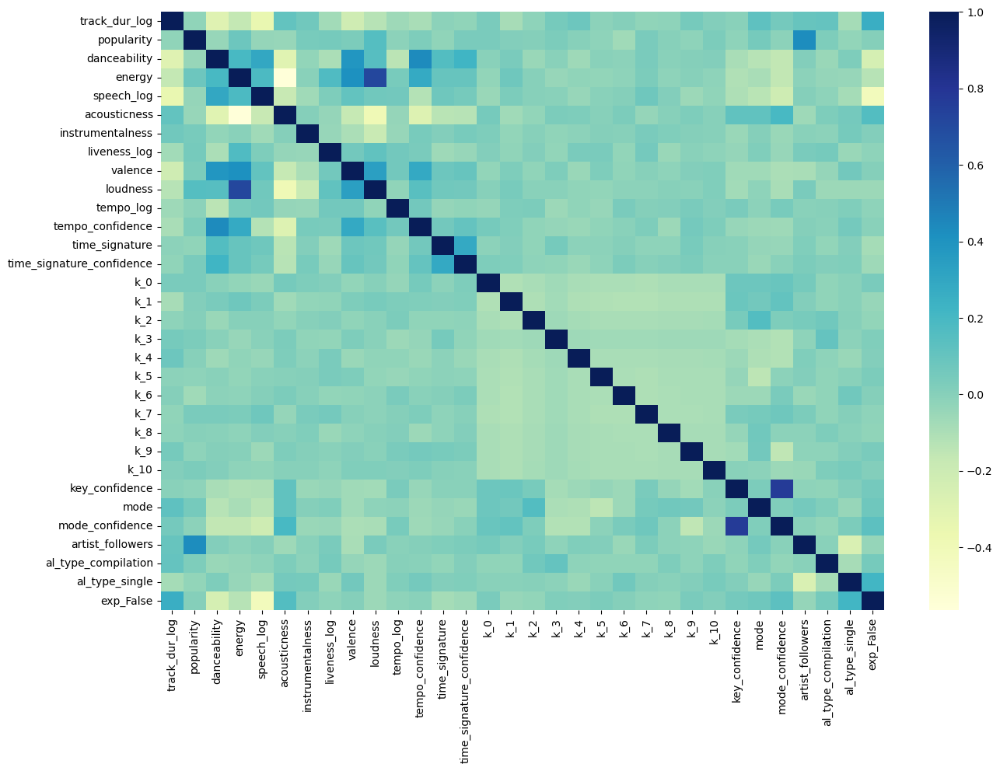

In [32]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
sns.heatmap(X_train_log.corr(), ax=ax, cmap="YlGnBu");

In [33]:
X_train_sc = X_train.copy()
X_train_sc = X_train_sc[['track_duration', 'popularity',
                            'danceability', 'energy', 'speechiness', 'acousticness',
                            'instrumentalness', 'liveness', 'valence', 'loudness', 'tempo',
                            'tempo_confidence', 'time_signature', 'time_signature_confidence',
                            'k_0', 'k_1', 'k_2', 'k_3', 'k_4', 'k_5', 'k_6', 'k_7',
                            'k_8', 'k_9', 'k_10', 'key_confidence', 'mode', 'mode_confidence', 'artist_followers',
                            'al_type_compilation', 'al_type_single', 'exp_False']]
X_train_sc.to_csv("train_set_sc.csv", index=False)

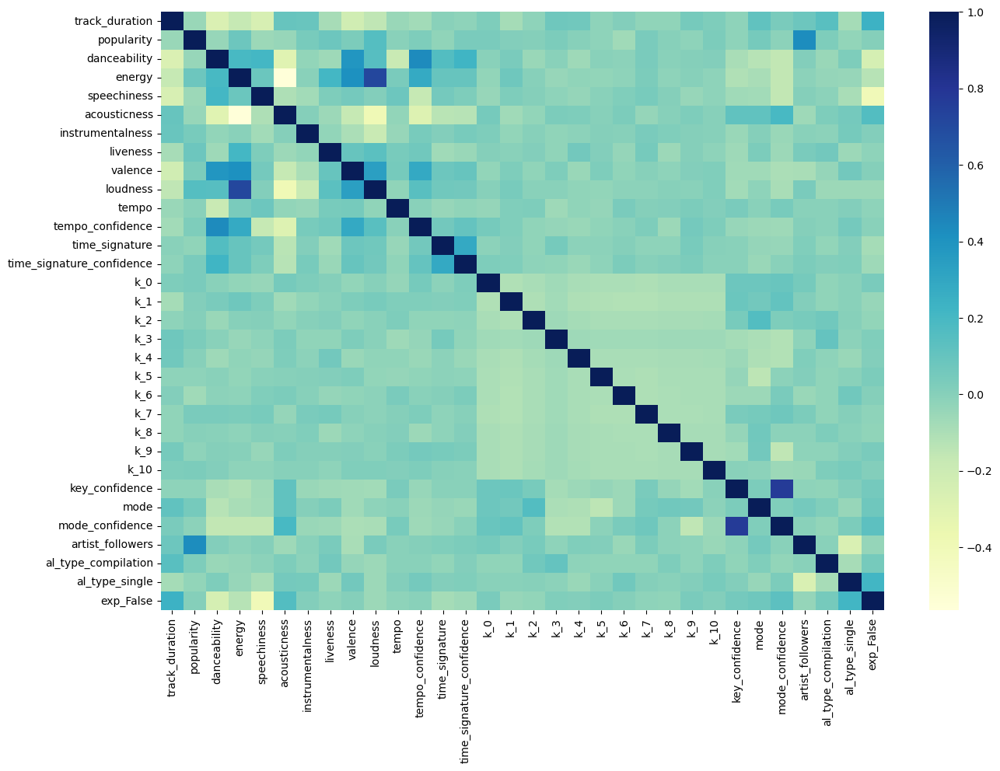

In [34]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
sns.heatmap(X_train_sc.corr(), ax=ax, cmap="YlGnBu");

## ESTANDARIZACIÓN

In [37]:
print(len(X_train_plain.columns))
print(len(X_train_plain_sc.columns))
len(X_train_plain.columns) == len(X_train_plain_sc.columns)


22
22


True

In [36]:
scaler = MinMaxScaler()

## Para plain
track_dur_sc = scaler.fit_transform(X_train_plain[["track_duration"]])
pop_sc = scaler.fit_transform(X_train_plain[["popularity"]])
loud_sc = scaler.fit_transform(X_train_plain[["loudness"]])
tempo_sc = scaler.fit_transform(X_train_plain[["tempo"]])
time_sc = scaler.fit_transform(X_train_plain[["time_signature"]])
key_sc = scaler.fit_transform(X_train_plain[["key"]])
follow_sc = scaler.fit_transform(X_train_plain[["artist_followers"]])

X_train_plain_sc = X_train_plain.copy()
X_train_plain_sc=X_train_plain_sc.assign(track_dur_sc=track_dur_sc,pop_sc=pop_sc,loud_sc=loud_sc,tempo_sc=tempo_sc,time_sc=time_sc,key_sc=key_sc,follow_sc=follow_sc)
X_train_plain_sc.drop(columns=(['track_duration','popularity','loudness','tempo','time_signature','key','artist_followers']),axis=1, inplace=True)

In [61]:
#GUARDAR scaler
scaler
with open('scaler.pkl', "wb") as file:
        pickle.dump(scaler, file)

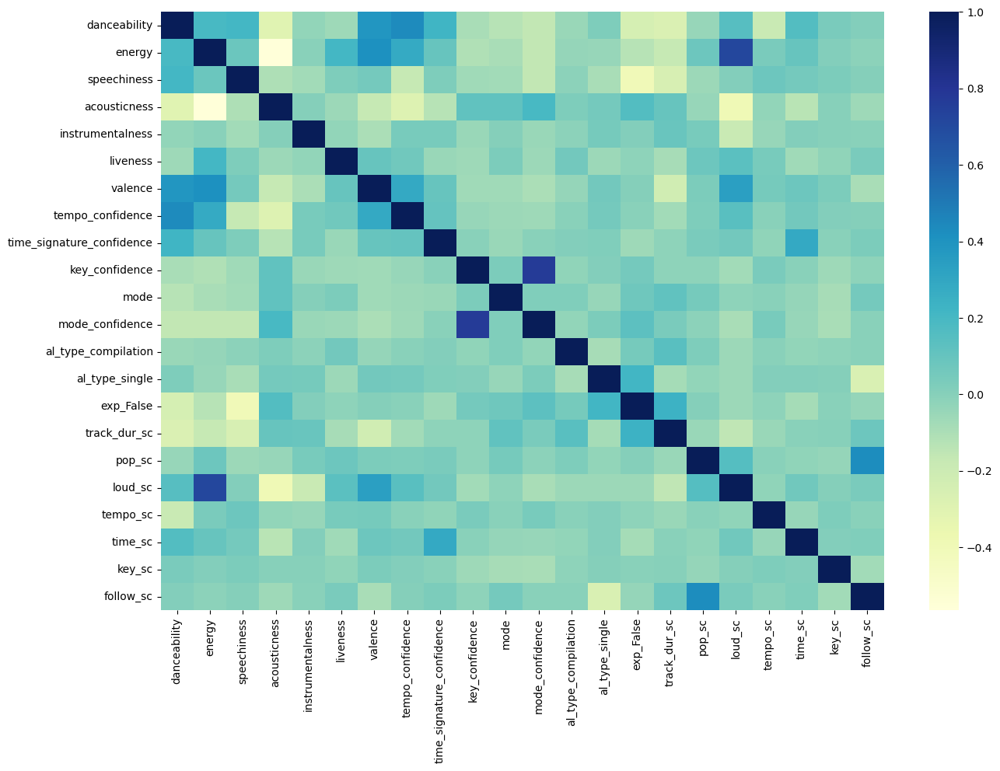

In [39]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
sns.heatmap(X_train_plain_sc.corr(), ax=ax, cmap="YlGnBu");

In [43]:
len(X_train_log.columns)==len(X_train_log_sc.columns)

True

In [41]:
## Para log
track_dur_l_sc = scaler.fit_transform(X_train_log[["track_dur_log"]])
pop_l_sc = scaler.fit_transform(X_train_log[["popularity"]])
speech_l_sc = scaler.fit_transform(X_train_log[["speech_log"]])
live_l_sc = scaler.fit_transform(X_train_log[["liveness_log"]])
#añadir loud_sc
tempo_l_sc = scaler.fit_transform(X_train_log[["tempo_log"]])
#añadir time_sc
#añadir follow_sc

X_train_log_sc = X_train_log.copy()
X_train_log_sc=X_train_log_sc.assign(track_dur_l_sc=track_dur_l_sc,pop_sc=pop_sc,speech_l_sc=speech_l_sc,live_l_sc=live_l_sc,loud_sc=loud_sc,tempo_l_sc=tempo_l_sc,time_sc=time_sc,
                      follow_sc=follow_sc)
X_train_log_sc.drop(columns=(['track_dur_log','popularity','speech_log','liveness_log','loudness','tempo_log','time_signature','artist_followers']),axis=1, inplace=True)

In [42]:
X_train_log_sc

,danceability,energy,acousticness,instrumentalness,valence,tempo_confidence,time_signature_confidence,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,key_confidence,mode,mode_confidence,al_type_compilation,al_type_single,exp_False,track_dur_l_sc,pop_sc,speech_l_sc,live_l_sc,loud_sc,tempo_l_sc,time_sc,follow_sc
654,0.811,0.889,0.1710,0.000350,0.870,0.280,1.000,0,0,0,0,0,0,0,0,0,0,0,0.570,1,0.650,0,1,1,0.419594,0.717391,0.272311,0.483219,0.847469,0.355715,0.75,0.002852
1338,0.616,0.690,0.6710,0.000000,0.446,0.473,0.345,0,0,0,0,1,0,0,0,0,0,0,0.577,1,0.577,0,1,1,0.565383,0.619565,0.106234,0.751365,0.821300,0.522049,0.75,0.000236
254,0.718,0.655,0.1870,0.000000,0.569,0.397,1.000,0,0,0,0,0,0,0,0,1,0,0,0.474,0,0.407,1,0,1,0.487821,0.706522,0.326546,0.831662,0.774583,0.404789,0.75,0.002456
1070,0.925,0.650,0.0569,0.006310,0.923,0.909,1.000,0,0,0,0,0,0,1,0,0,0,0,0.222,1,0.333,0,1,1,0.503411,0.467391,0.526506,0.382537,0.765164,0.654407,0.75,0.003250
1280,0.777,0.805,0.1140,0.000001,0.578,0.140,1.000,0,0,0,0,0,0,0,0,0,0,1,0.525,0,0.540,0,1,1,0.450208,0.510870,0.496440,0.440314,0.807703,0.870348,0.75,0.002305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.357,0.425,0.5840,0.000000,0.270,0.055,0.545,0,0,0,0,0,1,0,0,0,0,0,0.463,1,0.551,0,0,1,0.451906,0.858696,0.102121,0.715922,0.741084,0.420988,0.50,0.069242
1294,0.416,0.762,0.3120,0.804000,0.461,0.438,0.931,0,0,1,0,0,0,0,0,0,0,0,0.476,1,0.549,0,0,1,0.689294,0.815217,0.053296,0.251162,0.737894,0.372080,0.75,0.057879
860,0.427,0.444,0.6850,0.000000,0.595,0.141,0.969,0,1,0,0,0,0,0,0,0,0,0,0.711,1,0.689,0,1,1,0.488641,0.532609,0.061098,0.435617,0.750807,0.727279,0.75,0.000334
1459,0.658,0.451,0.5310,0.000034,0.472,0.059,1.000,0,0,0,0,0,0,1,0,0,0,0,0.660,1,0.650,0,1,1,0.578725,0.554348,0.159524,0.458316,0.725132,0.869766,0.75,0.000220


In [44]:
len(X_train_sc.columns)
X_train_sc.columns

Index(['track_duration', 'popularity', 'danceability', 'energy', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'loudness',
       'tempo', 'tempo_confidence', 'time_signature',
       'time_signature_confidence', 'k_0', 'k_1', 'k_2', 'k_3', 'k_4', 'k_5',
       'k_6', 'k_7', 'k_8', 'k_9', 'k_10', 'key_confidence', 'mode',
       'mode_confidence', 'artist_followers', 'al_type_compilation',
       'al_type_single', 'exp_False'],
      dtype='object')

In [45]:
## Para sc
#añadir track_dur_sc
#añadir pop_sc
#añadir loud_sc
#añadir tempo_sc
#añadir time_sc
#añadir follow_sc

X_train_sc=X_train_sc.assign(track_dur_sc=track_dur_sc,pop_sc=pop_sc,loud_sc=loud_sc,tempo_sc=tempo_sc,time_sc=time_sc,follow_sc=follow_sc)
#X_train_sc.drop(['track_duration','popularity','loudness','tempo','time_signature','artist_followers'],axis=1, inplace=True)

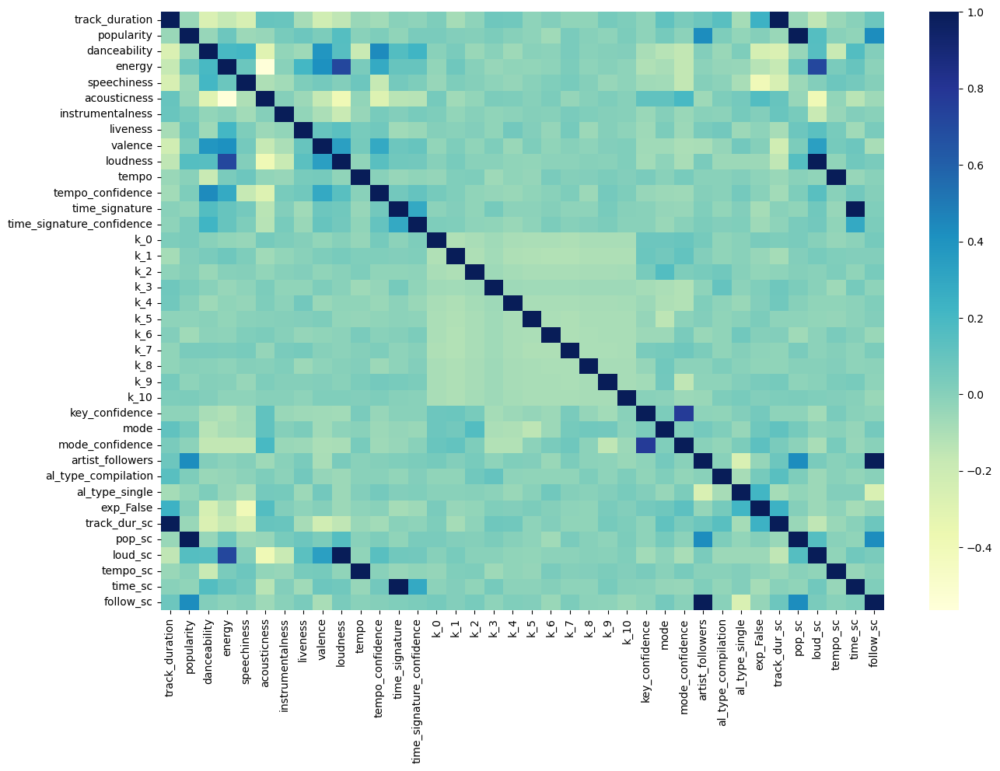

In [46]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
sns.heatmap(X_train_sc.corr(), ax=ax, cmap="YlGnBu");

## PCA

In [47]:
def pca_importance(pca):
    '''
    Given a PCA model, percentage of importance for each component is showed.
    '''
    components = pca.components_  # Axis of maximum variation
    n = len(components)
    x = np.arange(n)
    values = pca.explained_variance_ratio_ * 100
    acvalues = np.cumsum(values)

    fig, ax = plt.subplots(figsize=(18, 6))
    ax.bar(x, values)
    ax.plot(x, acvalues)
    for i in x:
        ax.annotate("{}%".format(round(values[i], 2)), (i-.1, values[i]),
                    fontsize=15)
        ax.annotate("{}%".format(round(acvalues[i], 2)), (i-.1, acvalues[i]),
                    fontsize=15)
    ax.set_xlabel("Number of Components")
    ax.set_ylabel("Variability (%)")

### X_train_plain_sc
En este df he dejado las variables tal cual, simplemente estandarizando valores.

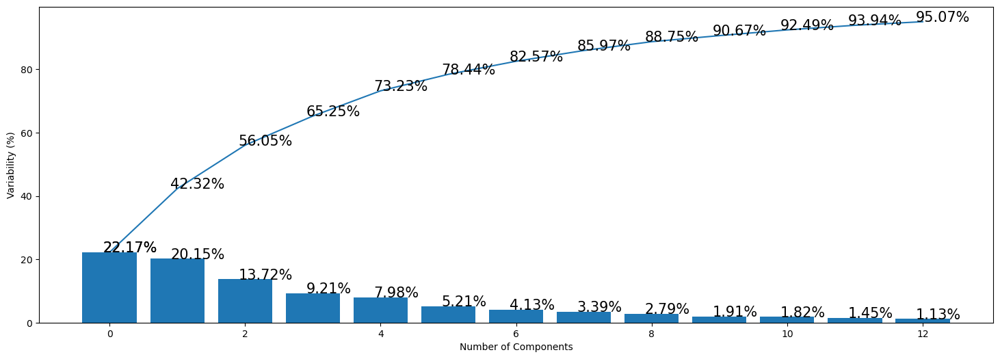

In [48]:
# Aplicación de PCA conservando el 95% de la varianza
pca1 = PCA(n_components=0.95)
X_train_plain_pca = pca1.fit_transform(X_train_plain_sc)

# Representación de la varianza explicada por cada componente
pca1.components_ 
pca_importance(pca1)

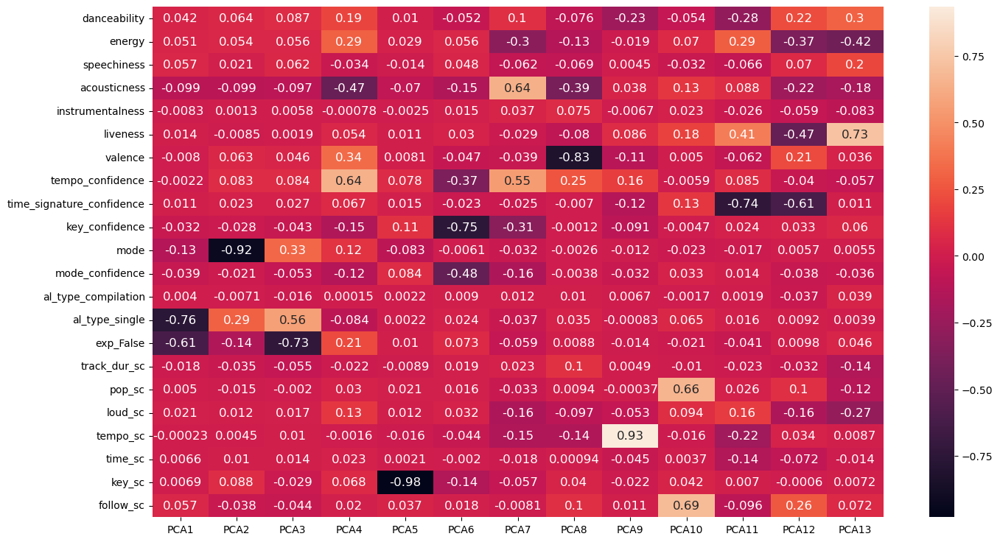

In [49]:
# Sacamos la matriz de pesos del PCA
component_names = ['PCA{}'.format(i) for i in range(1, pca1.components_.shape[0] + 1)]
loadings = pd.DataFrame(
                            pca1.components_.T,  # transpose the matrix of loadings
                            columns=component_names,  # so the columns are the principal components
                            index=X_train_plain_sc.columns,  # and the rows are the original features
                        )
fig, ax = plt.subplots(1,1, figsize=(16, 9))
sns.heatmap(loadings, annot=True, ax=ax, annot_kws={"size": 12});

#### RECONSTRUCCIÓN

In [336]:
reconstruccion = pca1.inverse_transform(X_train_plain_pca)
reconstruccion

array([[ 0.74506671,  0.84185205,  0.10246626, ...,  0.76559531,
         0.99897962,  0.00782628],
       [ 0.47657804,  0.63165047,  0.03443601, ...,  0.63050685,
         0.36552975, -0.03595207],
       [ 0.71467297,  0.67859871,  0.13298749, ...,  0.74227108,
         0.72563044,  0.05883317],
       ...,
       [ 0.52624332,  0.5098321 ,  0.08195577, ...,  0.72958449,
         0.08899054, -0.06007911],
       [ 0.56663709,  0.44763936,  0.12531046, ...,  0.74360518,
         0.54589312, -0.0283749 ],
       [ 0.88343335,  0.67667294,  0.12949818, ...,  0.7579121 ,
         0.99708416, -0.11880056]])

In [28]:
X_train_plain_sc

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo_confidence,time_signature_confidence,key_confidence,mode,mode_confidence,al_type_compilation,al_type_single,exp_False,track_dur_sc,pop_sc,loud_sc,tempo_sc,time_sc,key_sc,follow_sc
654,0.811,0.889,0.0617,0.1710,0.000350,0.1340,0.870,0.280,1.000,0.570,1,0.650,0,1,1,0.196772,0.717391,0.847469,0.223716,0.75,1.000000,0.002852
1338,0.616,0.690,0.0338,0.6710,0.000000,0.3680,0.446,0.473,0.345,0.577,1,0.577,0,1,1,0.317296,0.619565,0.821300,0.368200,0.75,0.363636,0.000236
254,0.718,0.655,0.0751,0.1870,0.000000,0.4980,0.569,0.397,1.000,0.474,0,0.407,1,0,1,0.248593,0.706522,0.774583,0.263237,0.75,0.727273,0.002456
1070,0.925,0.650,0.1550,0.0569,0.006310,0.0917,0.923,0.909,1.000,0.222,1,0.333,0,1,1,0.261516,0.467391,0.765164,0.506928,0.75,0.545455,0.003250
1280,0.777,0.805,0.1390,0.1140,0.000001,0.1140,0.578,0.140,1.000,0.525,0,0.540,0,1,1,0.219106,0.510870,0.807703,0.789448,0.75,0.909091,0.002305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.357,0.425,0.0333,0.5840,0.000000,0.3220,0.270,0.055,0.545,0.463,1,0.551,0,0,1,0.220388,0.858696,0.741084,0.276830,0.50,0.454545,0.069242
1294,0.416,0.762,0.0279,0.3120,0.804000,0.0559,0.461,0.438,0.931,0.476,1,0.549,0,0,1,0.453229,0.815217,0.737894,0.236625,0.75,0.181818,0.057879
860,0.427,0.444,0.0287,0.6850,0.000000,0.1120,0.595,0.141,0.969,0.711,1,0.689,0,1,1,0.249262,0.532609,0.750807,0.593799,0.75,0.090909,0.000334
1459,0.658,0.451,0.0410,0.5310,0.000034,0.1220,0.472,0.059,1.000,0.660,1,0.650,0,1,1,0.330288,0.554348,0.725132,0.788580,0.75,0.545455,0.000220


### X_train_log_sc
En este df están las transformaciones log a las features que mejoraban. Además de escalar los valores necesarios.

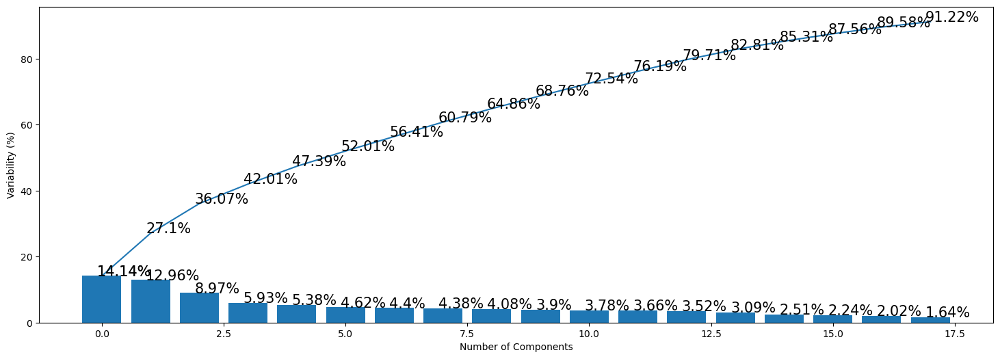

In [105]:
# Aplicación de PCA conservando el 95% de la varianza
pca2 = PCA(n_components=0.90)
X_train_log_pca = pca2.fit_transform(X_train_log_sc)

# Representación de la varianza explicada por cada componente
pca2.components_ 
pca_importance(pca2)

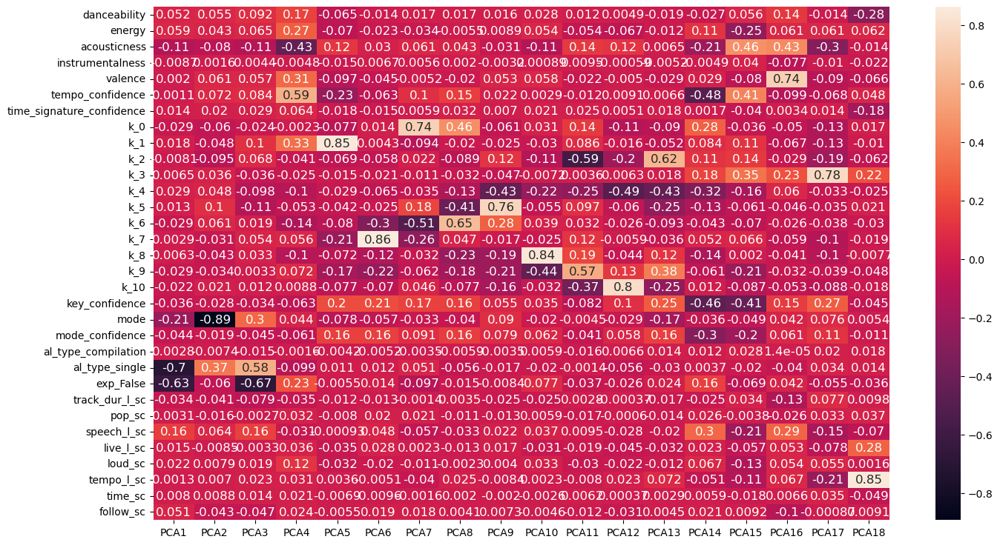

In [106]:
# Sacamos la matriz de pesos del PCA
component_names = ['PCA{}'.format(i) for i in range(1, pca2.components_.shape[0] + 1)]
loadings = pd.DataFrame(
                            pca2.components_.T,  # transpose the matrix of loadings
                            columns=component_names,  # so the columns are the principal components
                            index=X_train_log_sc.columns,  # and the rows are the original features
                        )
fig, ax = plt.subplots(1,1, figsize=(16, 9))
sns.heatmap(loadings, annot=True, ax=ax, annot_kws={"size": 12});

### X_train_sc
En este df está key en one hot y los valores necesarios escaldos.

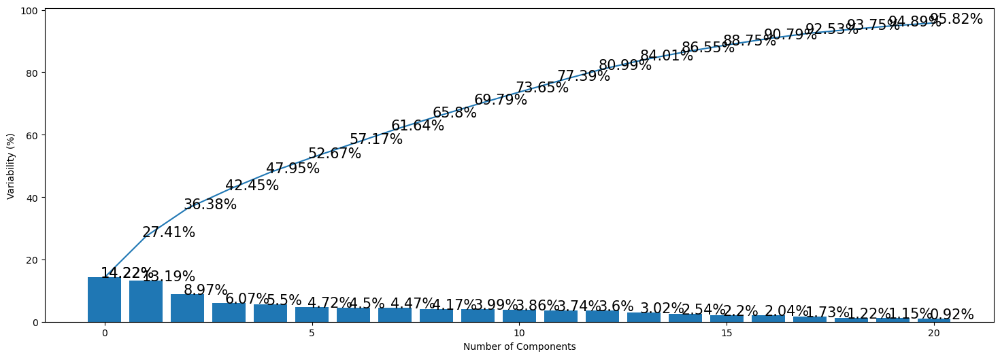

In [107]:
# Aplicación de PCA conservando el 95% de la varianza
pca3 = PCA(n_components=0.95)
X_train_sc_pca = pca3.fit_transform(X_train_sc)

# Representación de la varianza explicada por cada componente
pca3.components_ 
pca_importance(pca3)

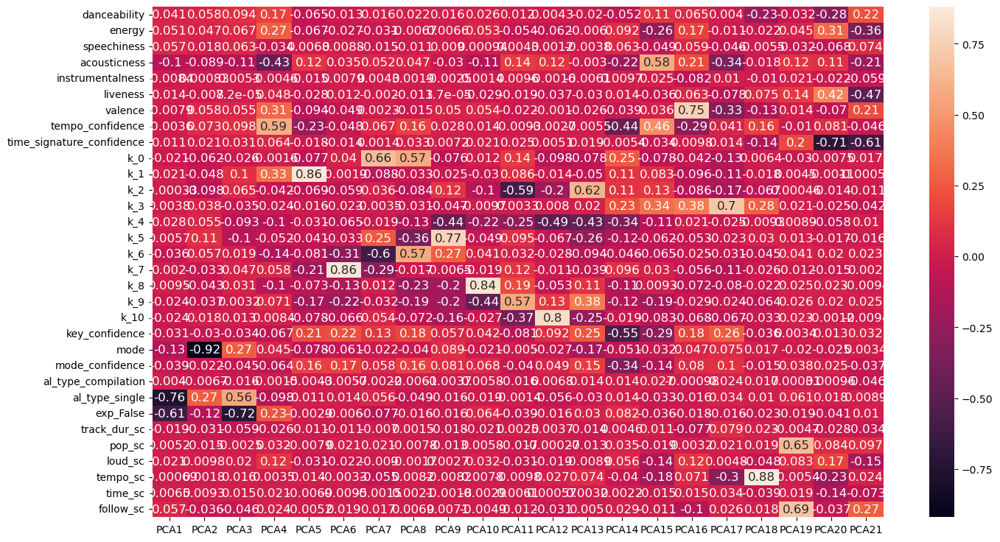

In [108]:
# Sacamos la matriz de pesos del PCA
component_names = ['PCA{}'.format(i) for i in range(1, pca3.components_.shape[0] + 1)]
loadings = pd.DataFrame(
                            pca3.components_.T,  # transpose the matrix of loadings
                            columns=component_names,  # so the columns are the principal components
                            index=X_train_sc.columns,  # and the rows are the original features
                        )
fig, ax = plt.subplots(1,1, figsize=(16, 9))
sns.heatmap(loadings, annot=True, ax=ax, annot_kws={"size": 12});

#### X_train_sc_sin
Esta vez sin las cols de confidence.

In [132]:
X_train_sc.columns

Index(['danceability', 'energy', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo_confidence',
       'time_signature_confidence', 'k_0', 'k_1', 'k_2', 'k_3', 'k_4', 'k_5',
       'k_6', 'k_7', 'k_8', 'k_9', 'k_10', 'key_confidence', 'mode',
       'mode_confidence', 'al_type_compilation', 'al_type_single', 'exp_False',
       'track_dur_sc', 'pop_sc', 'loud_sc', 'tempo_sc', 'time_sc',
       'follow_sc'],
      dtype='object')

In [133]:
X_train_sc_sin = X_train_sc.copy()
X_train_sc_sin.drop(columns=['tempo_confidence','time_signature_confidence','key_confidence','mode_confidence'], axis=1, inplace=True)

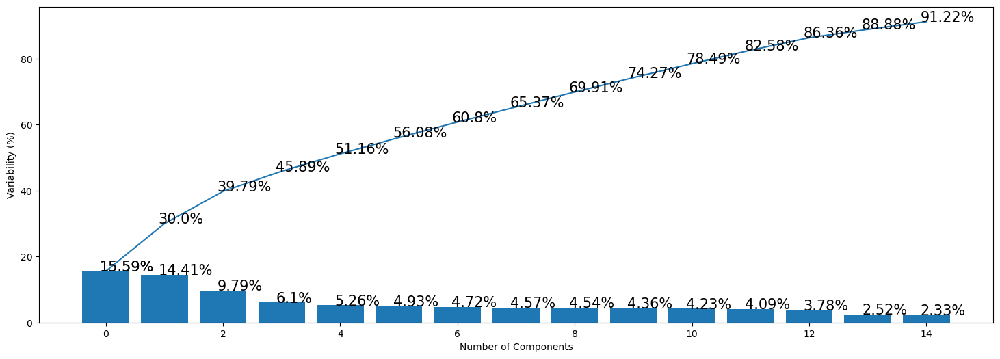

In [140]:
# Aplicación de PCA conservando el 95% de la varianza
pca4 = PCA(n_components=0.90)
X_train_sin_pca = pca4.fit_transform(X_train_sc_sin)

# Representación de la varianza explicada por cada componente
pca4.components_ 
pca_importance(pca4)

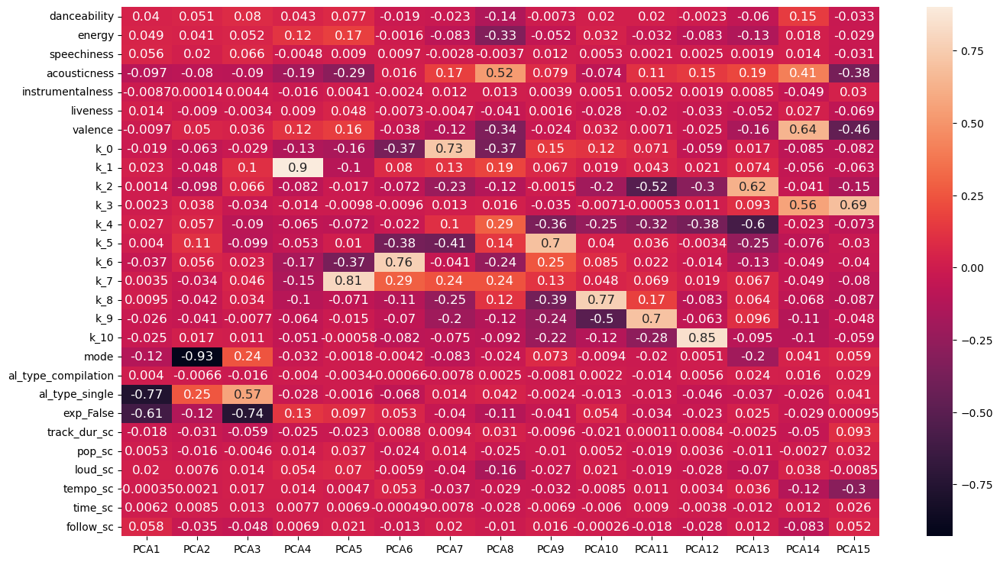

In [141]:
# Sacamos la matriz de pesos del PCA
component_names = ['PCA{}'.format(i) for i in range(1, pca4.components_.shape[0] + 1)]
loadings = pd.DataFrame(
                            pca4.components_.T,  # transpose the matrix of loadings
                            columns=component_names,  # so the columns are the principal components
                            index=X_train_sc_sin.columns,  # and the rows are the original features
                        )
fig, ax = plt.subplots(1,1, figsize=(16, 9))
sns.heatmap(loadings, annot=True, ax=ax, annot_kws={"size": 12});

## K-MEANS

### PRIMERA PCA 

In [62]:
#from sklearn.cluster import KMeans

X1 = X_train_plain_pca

kmeans_per_k1 = [KMeans(n_clusters=k, random_state=42).fit(X1)
                for k in range(1, 12)]

inertias1 = [model.inertia_ for model in kmeans_per_k1]

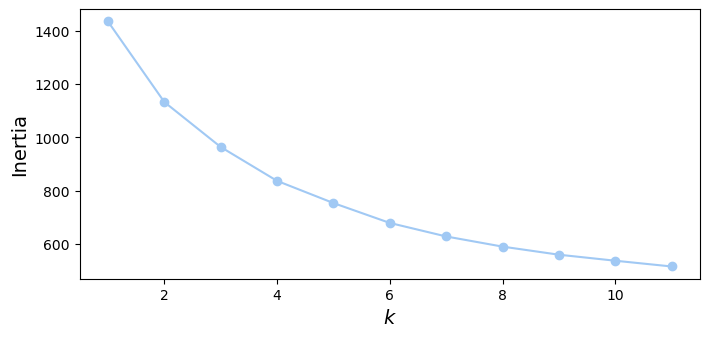

INERTIA:  [1433.985872458908, 1132.1667390755665, 963.5797773092831, 836.6422347516097, 753.5441235980232, 679.0140139019566, 628.3228287090839, 590.2922002248752, 559.9618577510703, 537.3876069078462, 515.8434188460333]


In [63]:
plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 12), inertias1, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.show();
print("INERTIA: ", inertias1)

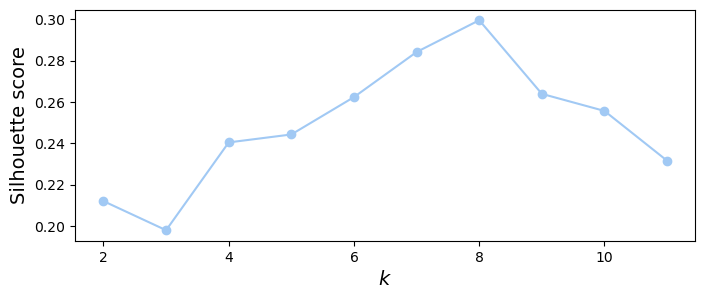

SILHOUETTE SCORE:  [0.21207505989130257, 0.1980086502036021, 0.24043140880830052, 0.24427019288744928, 0.2623171819213547, 0.2841009516043172, 0.2994633849775447, 0.26389075698548614, 0.2556372609429089, 0.23159577905399023]


In [67]:
silhouette_scores1= [silhouette_score(X1, model.labels_)
                     for model in kmeans_per_k1[1:]]

plt.figure(figsize=(8, 3))
plt.plot(range(2, 12), silhouette_scores1, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
#plt.axis([1.8, 8.5, 0.55, 0.7])
plt.show();
#En silhouette score queremos que el codo sea máximo, nos fijamos en eso. Por eso -> k=8 parece la mejor opoción
print("SILHOUETTE SCORE: ", silhouette_scores1)

For n_clusters = 2 The average silhouette_score is : 0.21207505989130257
For n_clusters = 4 The average silhouette_score is : 0.24043140880830052
For n_clusters = 5 The average silhouette_score is : 0.24427019288744928
For n_clusters = 6 The average silhouette_score is : 0.2623171819213547
For n_clusters = 7 The average silhouette_score is : 0.2841009516043172
For n_clusters = 8 The average silhouette_score is : 0.2994633849775447
For n_clusters = 9 The average silhouette_score is : 0.26389075698548614
For n_clusters = 10 The average silhouette_score is : 0.2556372609429089


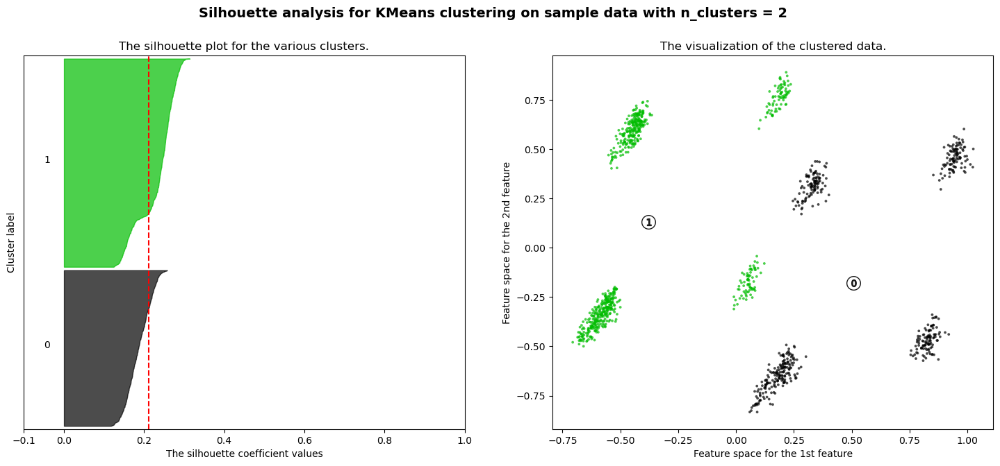

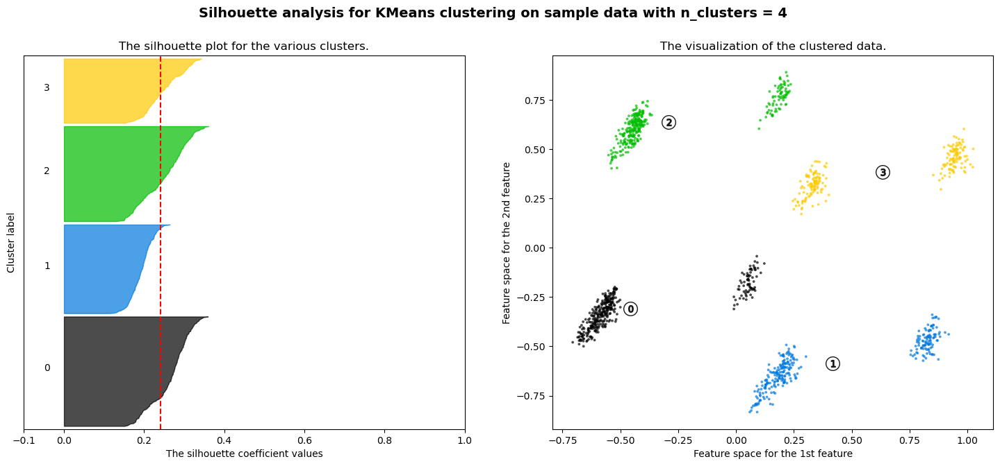

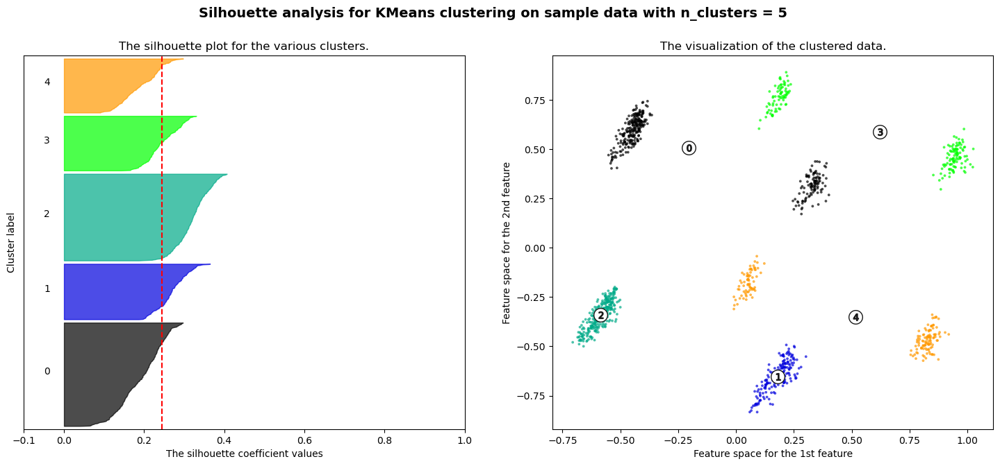

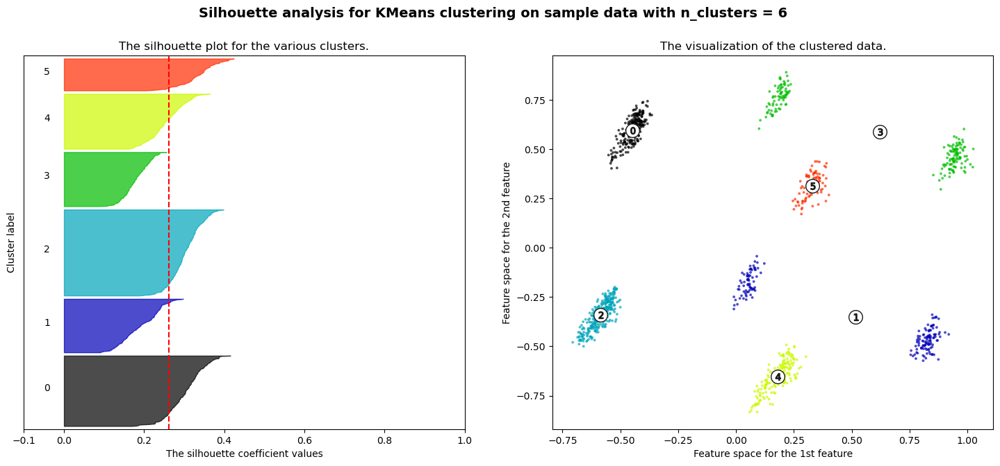

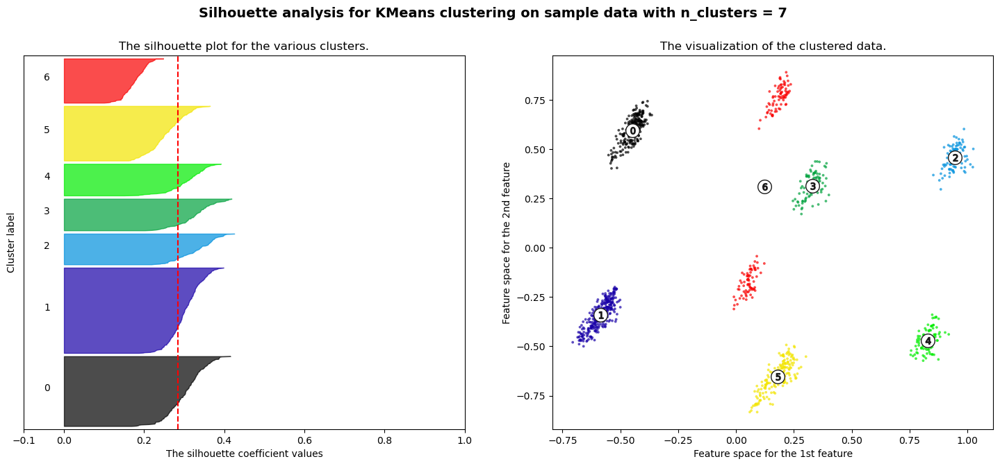

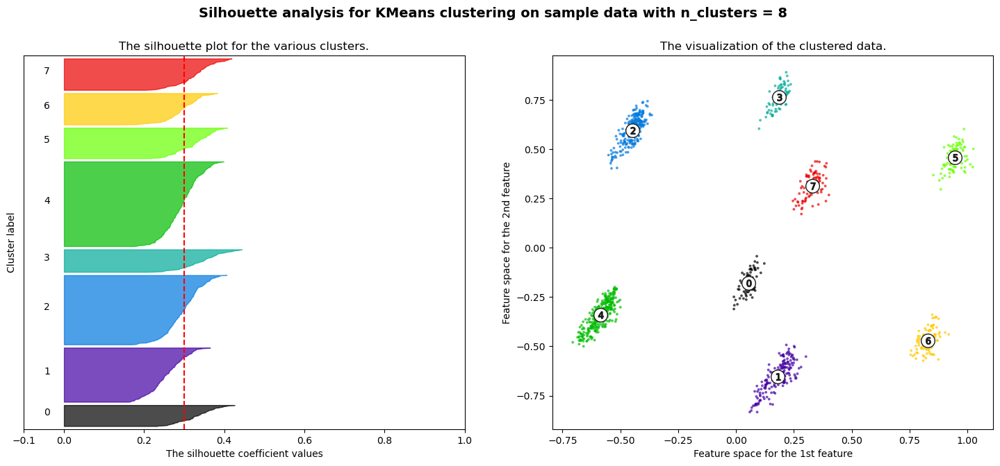

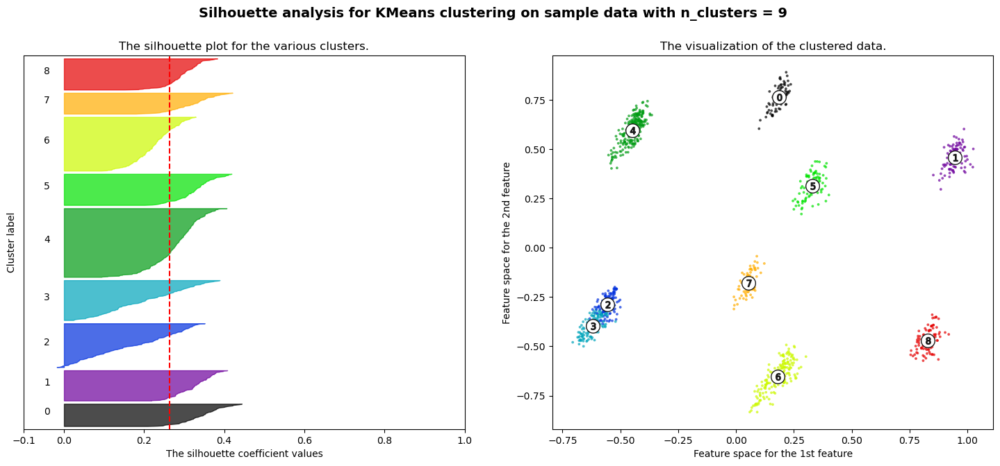

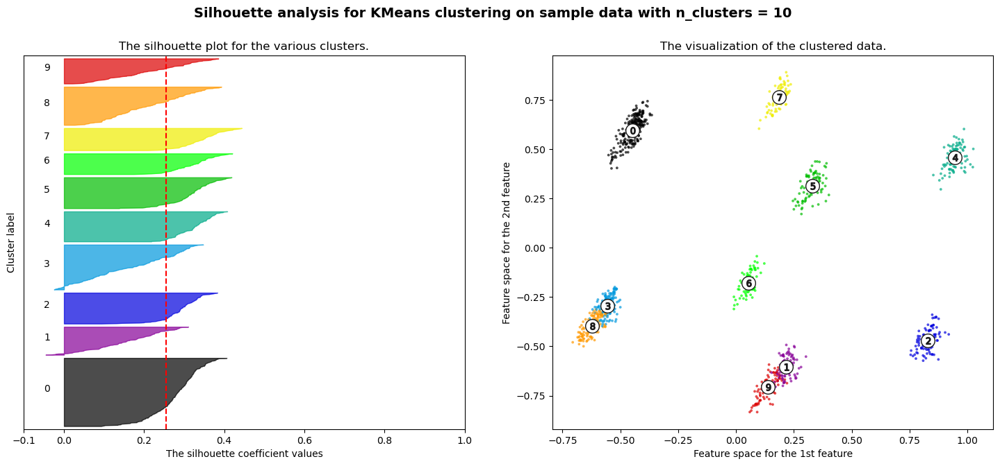

In [65]:
range_n_clusters = [2, 4, 5, 6, 7,8,9,10]
X = X1
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show();

### SEGUNDA PCA

In [124]:
X2 = X_train_log_pca 

kmeans_per_k2 = [KMeans(n_clusters=k, random_state=42).fit(X2)
                for k in range(1, 12)]

inertias2 = [model.inertia_ for model in kmeans_per_k2]

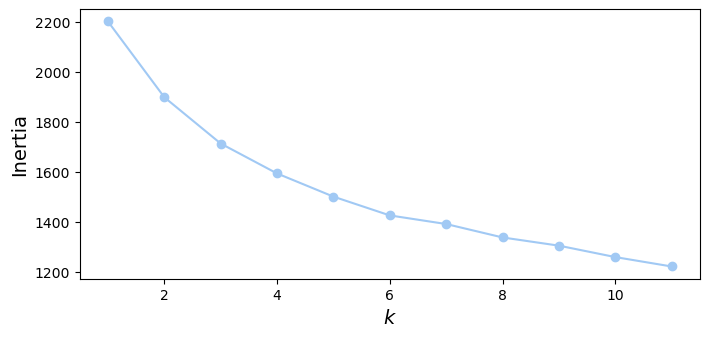

INERTIA:  [2200.438517888776, 1897.292087855019, 1712.1755268698666, 1592.491295623507, 1499.8426592888309, 1424.7045551257627, 1390.2357617191901, 1336.5563935827922, 1303.7205465835782, 1258.0380449177264, 1220.4422982027888]


In [125]:
plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 12), inertias2, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.show();
print("INERTIA: ", inertias2)

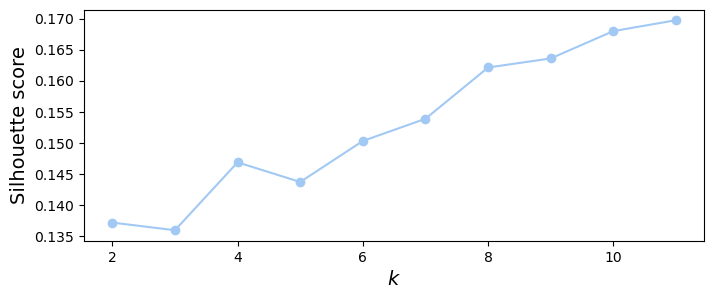

SILHOUETTE SCORE:  [0.13717288768315306, 0.13594507043313456, 0.14686922847882986, 0.14370515566473485, 0.15030234456779087, 0.15387300250457125, 0.16212232683975694, 0.16357951501031354, 0.16797843279020644, 0.1697274787979107]


In [126]:
silhouette_scores2= [silhouette_score(X2, model.labels_)
                     for model in kmeans_per_k2[1:]]

plt.figure(figsize=(8, 3))
plt.plot(range(2, 12), silhouette_scores2, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
#plt.axis([1.8, 8.5, 0.55, 0.7])
plt.show();
#En silhouette score queremos que el codo sea máximo, nos fijamos en eso. Por eso -> k=8 parece la mejor opoción
print("SILHOUETTE SCORE: ", silhouette_scores2)

For n_clusters = 2 The average silhouette_score is : 0.13717288768315306
For n_clusters = 4 The average silhouette_score is : 0.14686922847882986
For n_clusters = 5 The average silhouette_score is : 0.14370515566473485
For n_clusters = 6 The average silhouette_score is : 0.15030234456779087
For n_clusters = 7 The average silhouette_score is : 0.15387300250457125
For n_clusters = 8 The average silhouette_score is : 0.16212232683975694
For n_clusters = 9 The average silhouette_score is : 0.16357951501031354
For n_clusters = 10 The average silhouette_score is : 0.16797843279020644


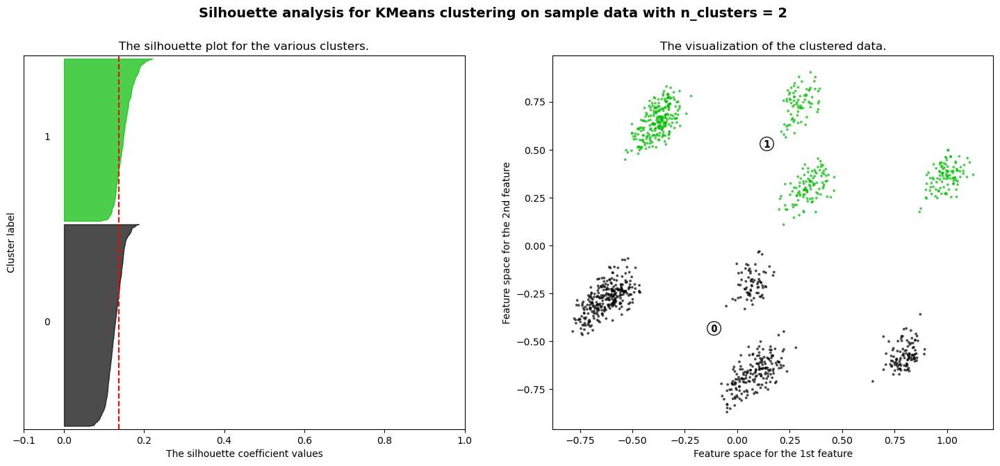

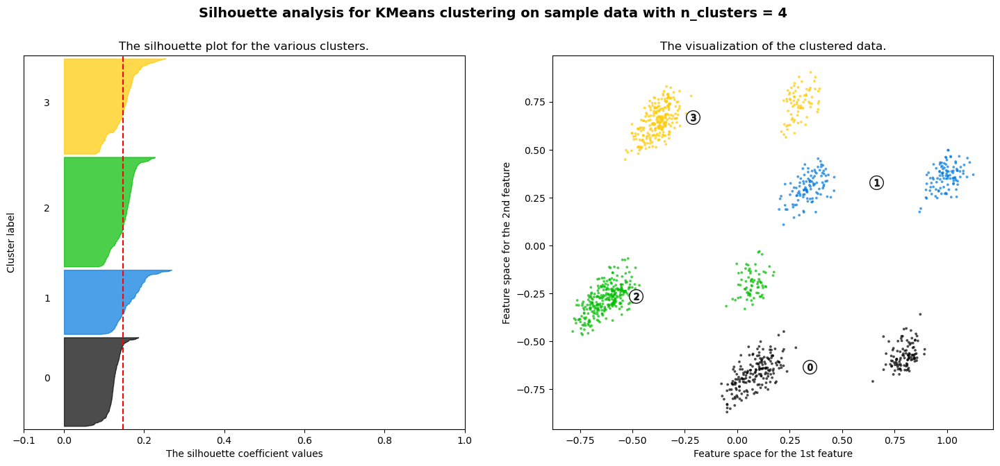

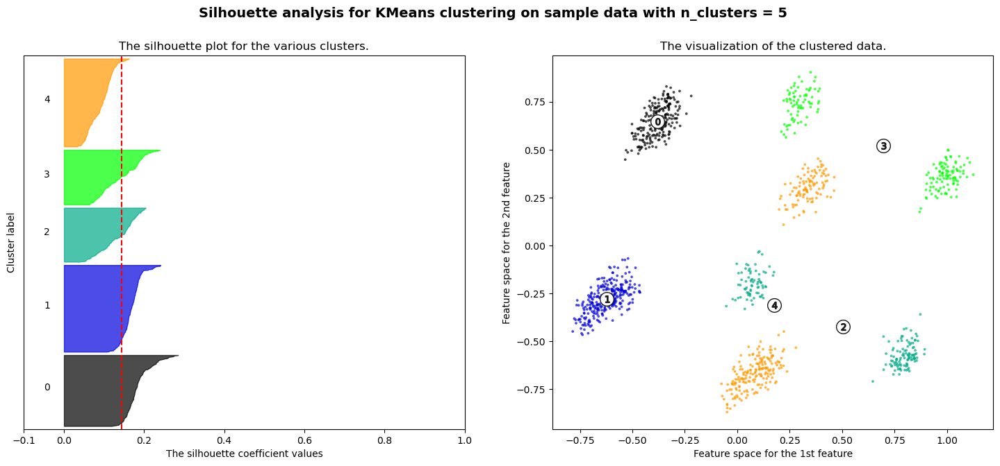

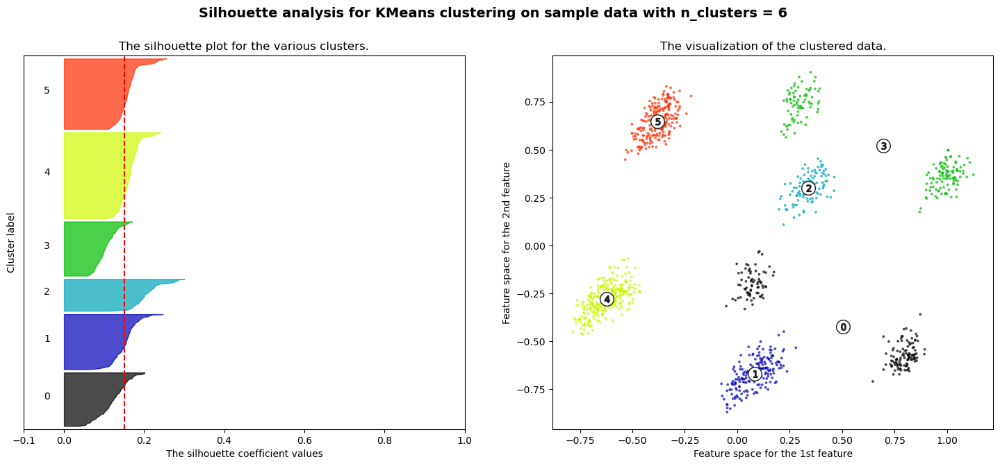

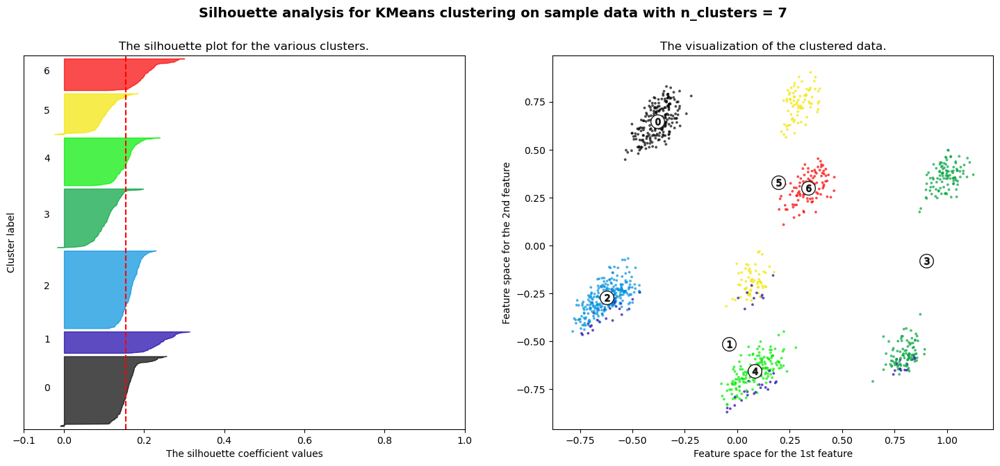

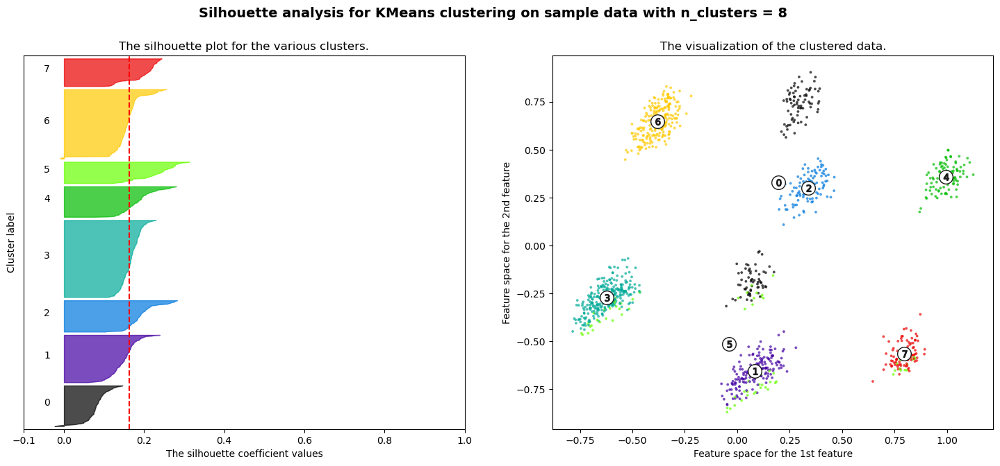

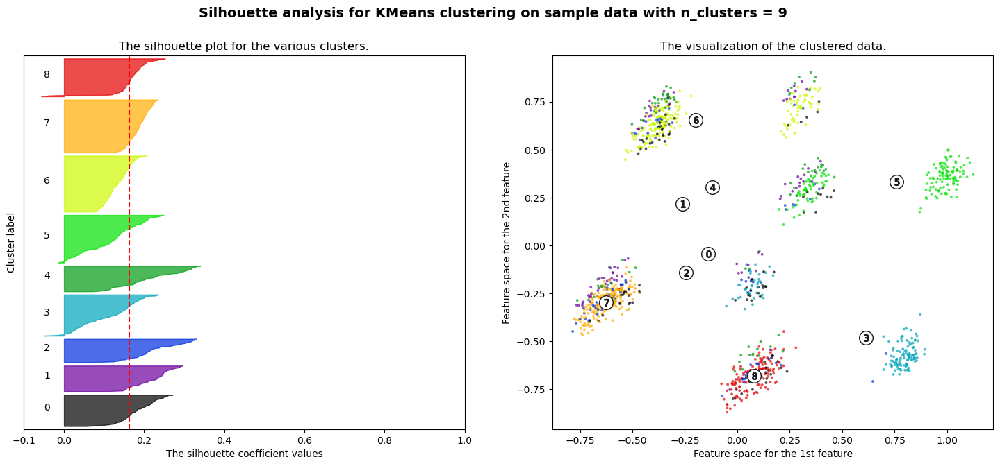

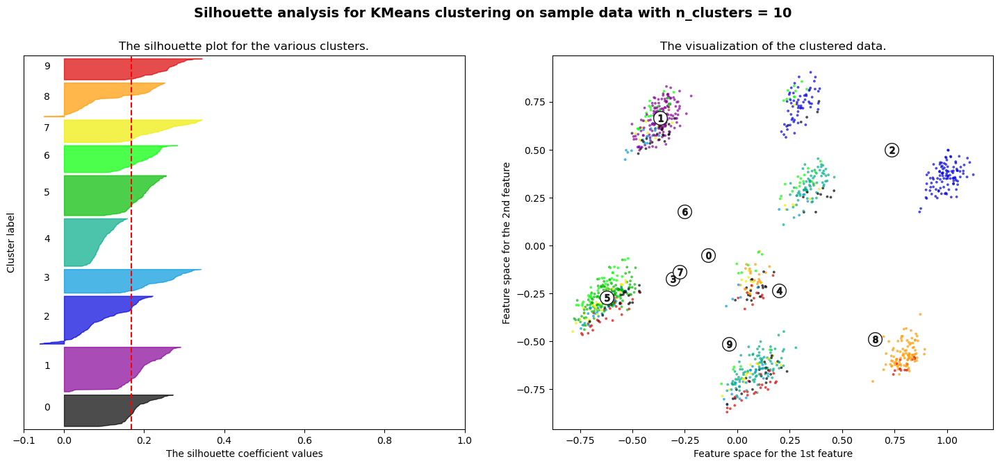

In [127]:
range_n_clusters = [2, 4, 5, 6, 7,8,9,10]
X = X2
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show();

### TERCERA PCA

In [128]:
X3 = X_train_sc_pca 

kmeans_per_k3 = [KMeans(n_clusters=k, random_state=42).fit(X3)
                for k in range(1, 12)]

inertias3 = [model.inertia_ for model in kmeans_per_k3]

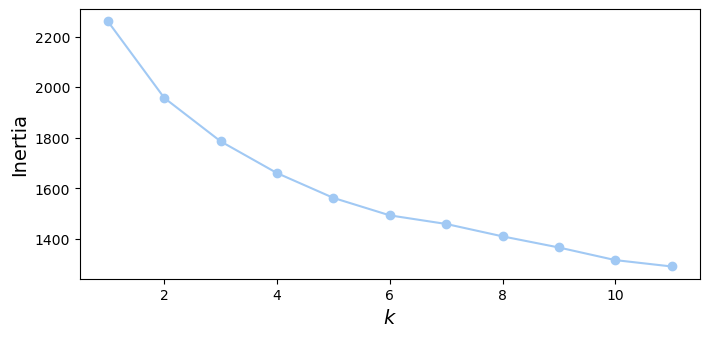

INERTIA:  [2260.019146881656, 1957.381741636418, 1785.5955392551036, 1660.0924213282028, 1561.9993336763239, 1492.9426808580433, 1458.9112352168827, 1409.9033923126399, 1365.844226580331, 1315.9641172059296, 1290.7346771610487]


In [129]:
plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 12), inertias3, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.show();
print("INERTIA: ", inertias3)

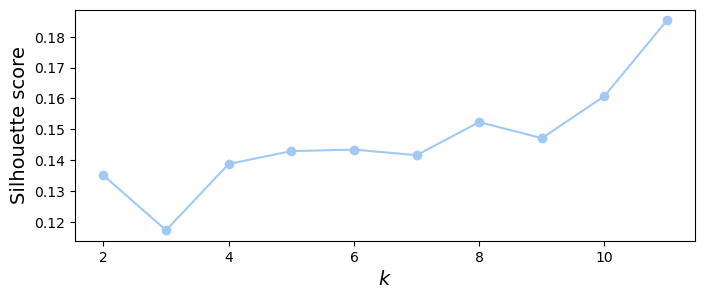

SILHOUETTE SCORE:  [0.13508267595178947, 0.11735145355873153, 0.13881080259143716, 0.14296704303213062, 0.14345703644838215, 0.14164153082741374, 0.15237486000003564, 0.14714567780709192, 0.16077853079310614, 0.18534273504145327]


In [130]:
silhouette_scores3= [silhouette_score(X3, model.labels_)
                     for model in kmeans_per_k3[1:]]

plt.figure(figsize=(8, 3))
plt.plot(range(2, 12), silhouette_scores3, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
#plt.axis([1.8, 8.5, 0.55, 0.7])
plt.show();
#En silhouette score queremos que el codo sea máximo, nos fijamos en eso. Por eso -> k=8 parece la mejor opoción
print("SILHOUETTE SCORE: ", silhouette_scores3)

For n_clusters = 2 The average silhouette_score is : 0.13508267595178947
For n_clusters = 4 The average silhouette_score is : 0.13881080259143716
For n_clusters = 5 The average silhouette_score is : 0.14296704303213062
For n_clusters = 6 The average silhouette_score is : 0.14345703644838215
For n_clusters = 7 The average silhouette_score is : 0.14164153082741374
For n_clusters = 8 The average silhouette_score is : 0.15237486000003564
For n_clusters = 9 The average silhouette_score is : 0.14714567780709192
For n_clusters = 10 The average silhouette_score is : 0.16077853079310614


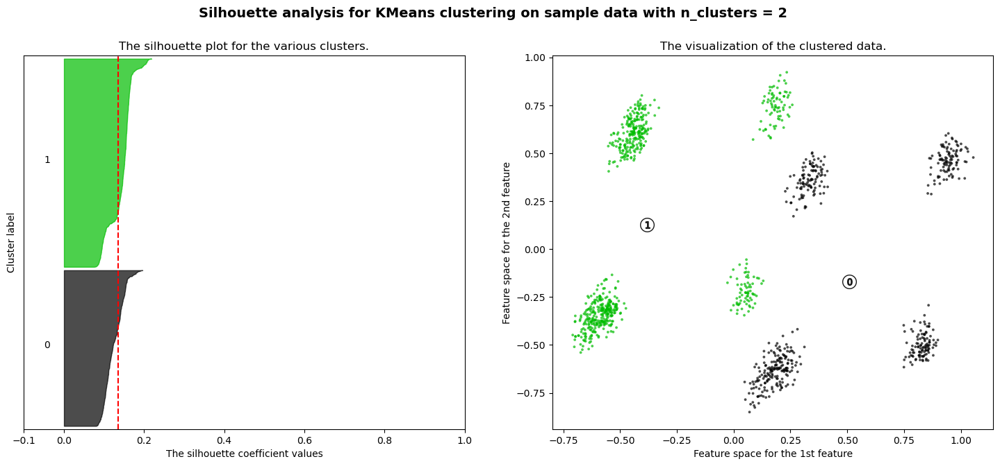

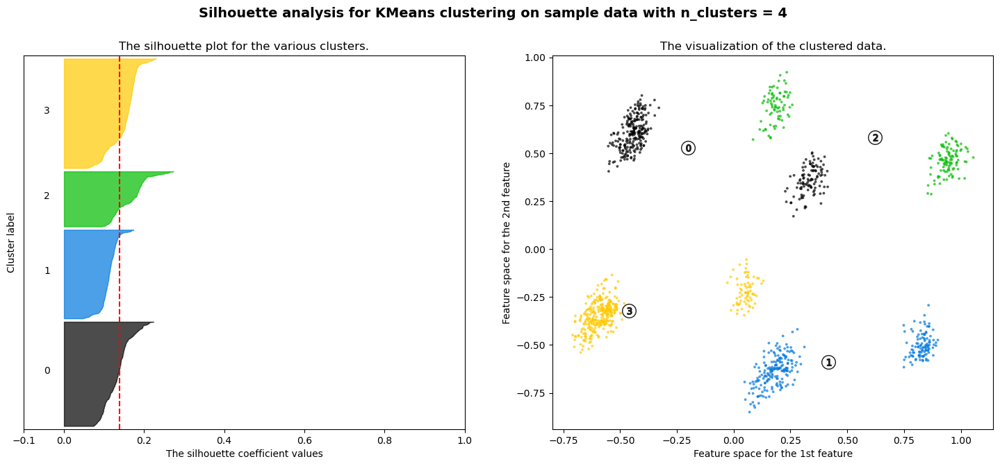

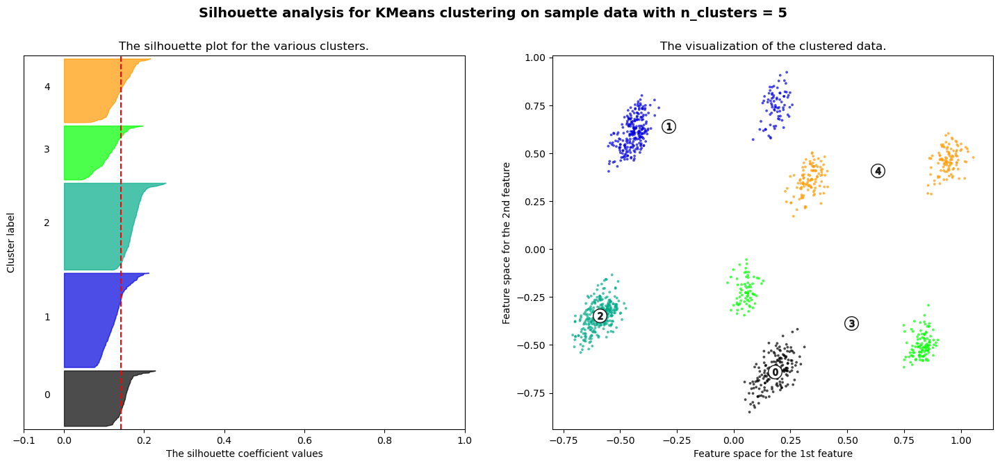

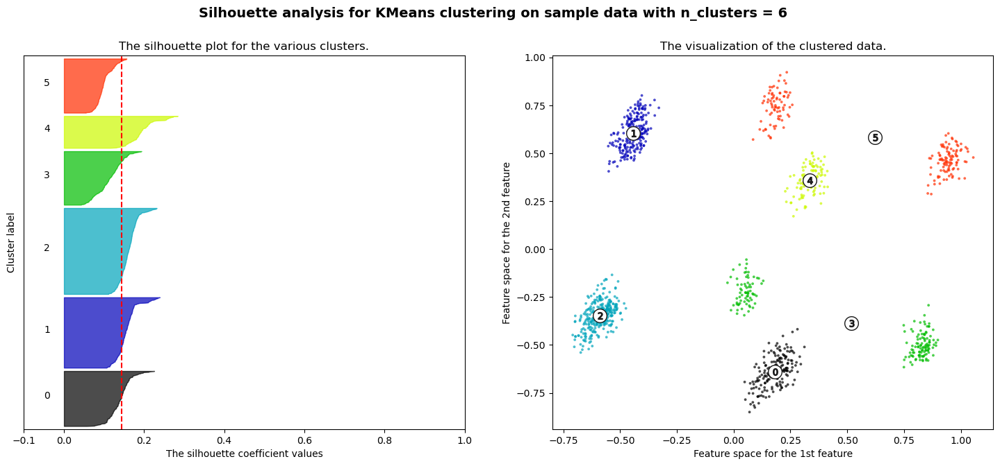

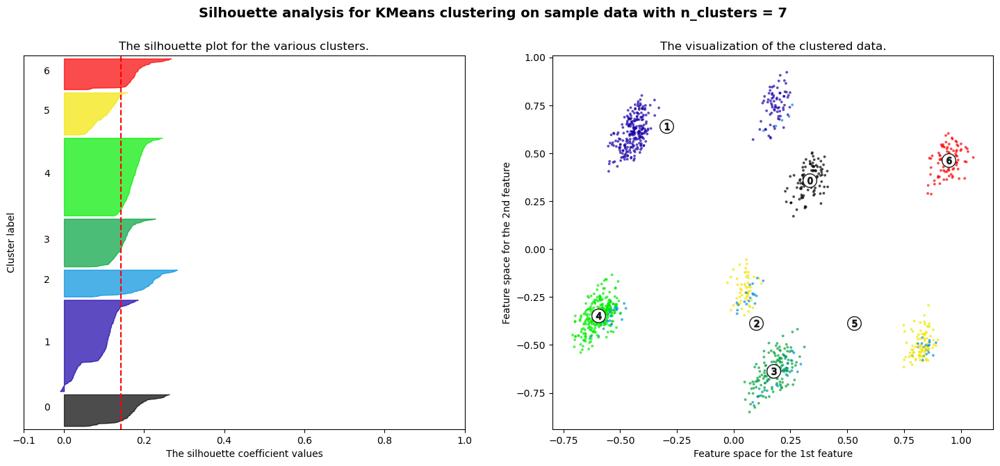

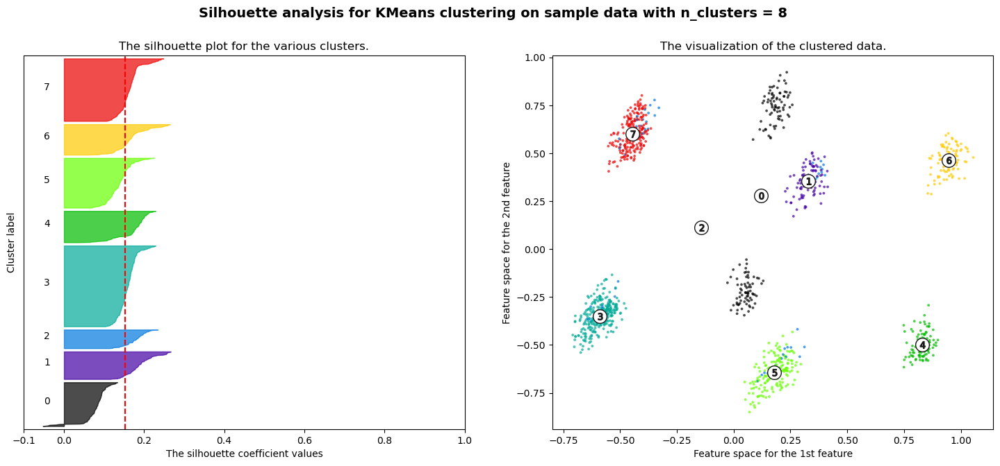

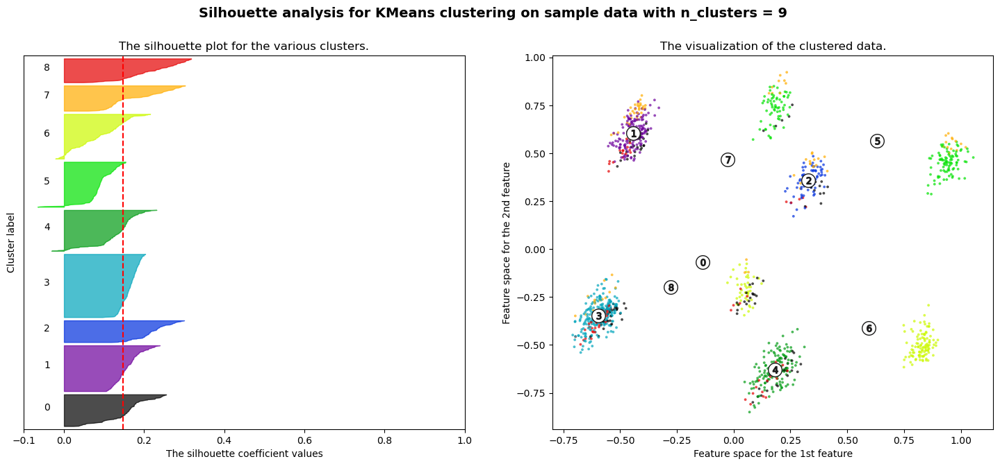

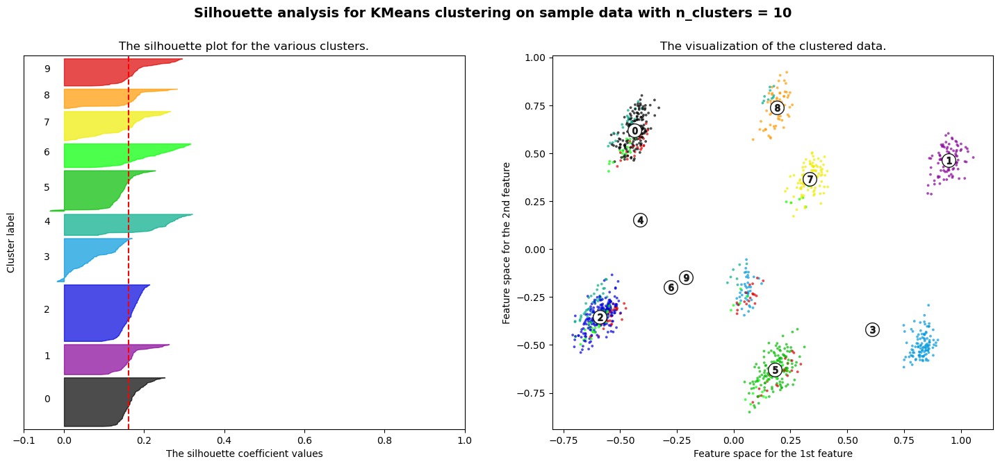

In [131]:
range_n_clusters = [2, 4, 5, 6, 7,8,9,10]
X = X3
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show();

### CUARTA PCA

In [144]:
X4 = X_train_sin_pca 

kmeans_per_k4 = [KMeans(n_clusters=k, random_state=42).fit(X4)
                for k in range(1, 12)]

inertias4 = [model.inertia_ for model in kmeans_per_k4]

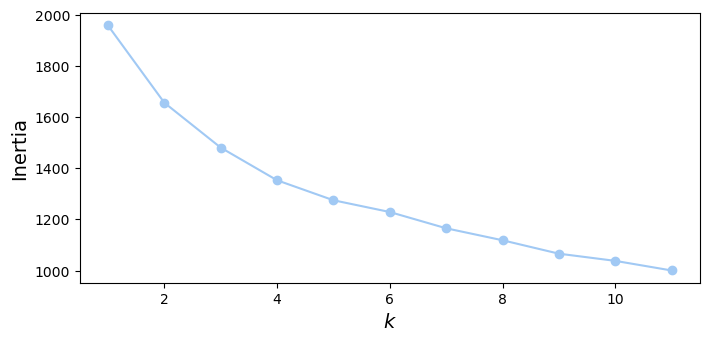

INERTIA:  [1958.987966336962, 1656.6747351245267, 1480.96781283609, 1353.1428683040208, 1274.954232239018, 1228.914281079787, 1165.2375093815199, 1118.372082722602, 1065.8387265415531, 1037.7205394429097, 1000.1158547670017]


In [145]:
plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 12), inertias4, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.show();
print("INERTIA: ", inertias4)

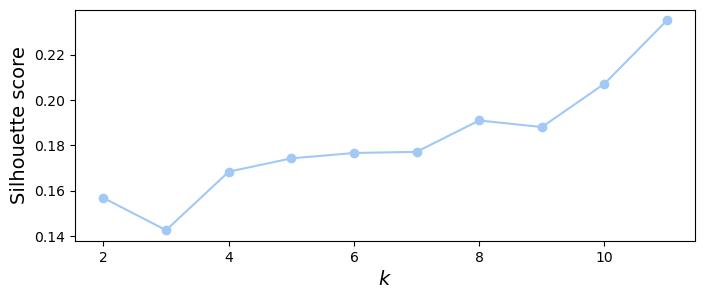

SILHOUETTE SCORE:  [0.156785098151356, 0.14254880843608006, 0.16836119742228672, 0.17424206454105168, 0.1765962340793162, 0.17711562357262906, 0.1909537360518866, 0.1880384564863855, 0.20713862045652917, 0.23515092121117653]


In [146]:
silhouette_scores4= [silhouette_score(X4, model.labels_)
                     for model in kmeans_per_k3[1:]]

plt.figure(figsize=(8, 3))
plt.plot(range(2, 12), silhouette_scores4, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
#plt.axis([1.8, 8.5, 0.55, 0.7])
plt.show();
#En silhouette score queremos que el codo sea máximo, nos fijamos en eso. Por eso -> k=8 parece la mejor opoción
print("SILHOUETTE SCORE: ", silhouette_scores4)

For n_clusters = 2 The average silhouette_score is : 0.156785098151356
For n_clusters = 4 The average silhouette_score is : 0.17130654224063724
For n_clusters = 5 The average silhouette_score is : 0.16701917101617886
For n_clusters = 6 The average silhouette_score is : 0.1705753988137875
For n_clusters = 7 The average silhouette_score is : 0.18573792708098288
For n_clusters = 8 The average silhouette_score is : 0.1846239908172214
For n_clusters = 9 The average silhouette_score is : 0.19997400232760196
For n_clusters = 10 The average silhouette_score is : 0.19945553796177914


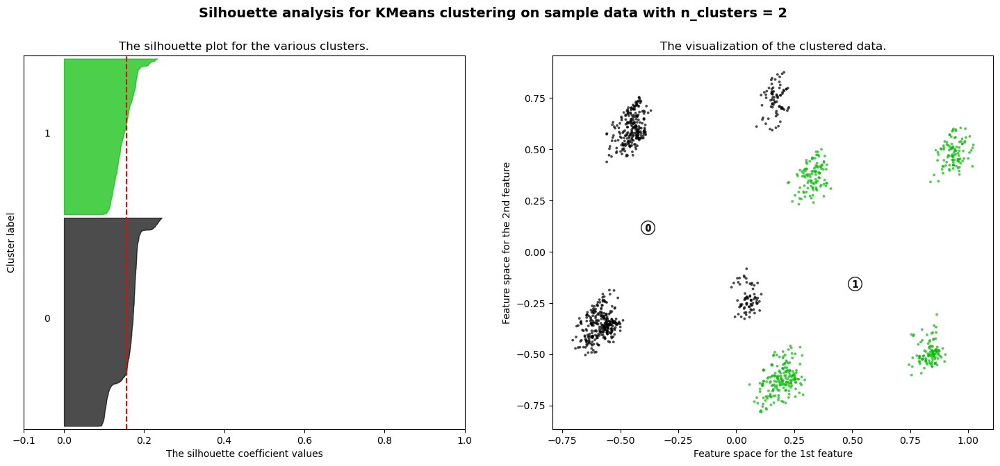

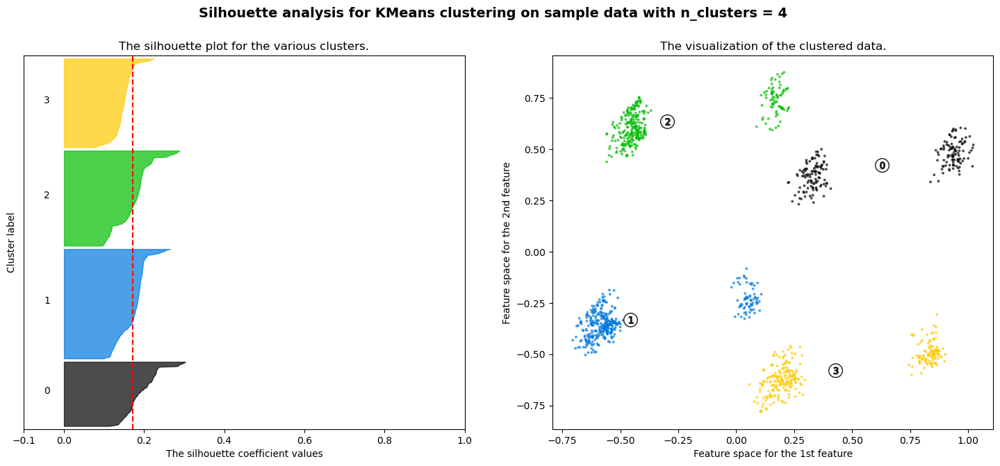

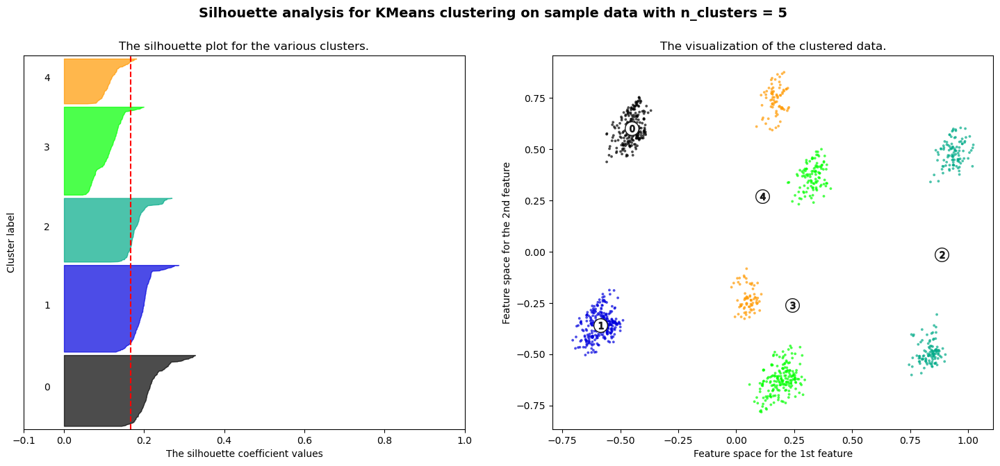

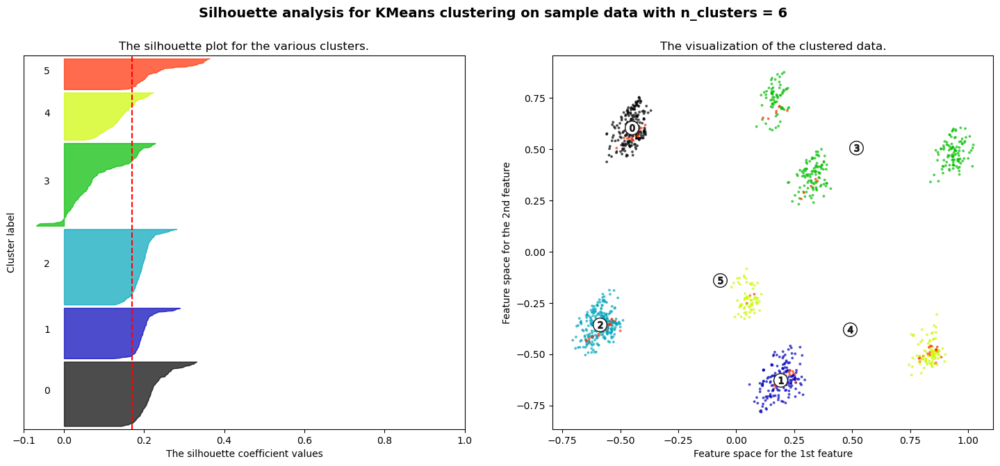

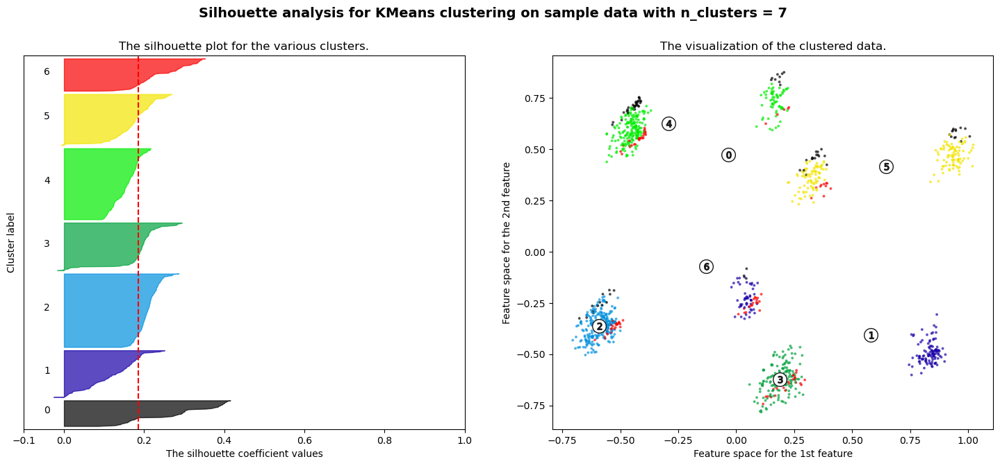

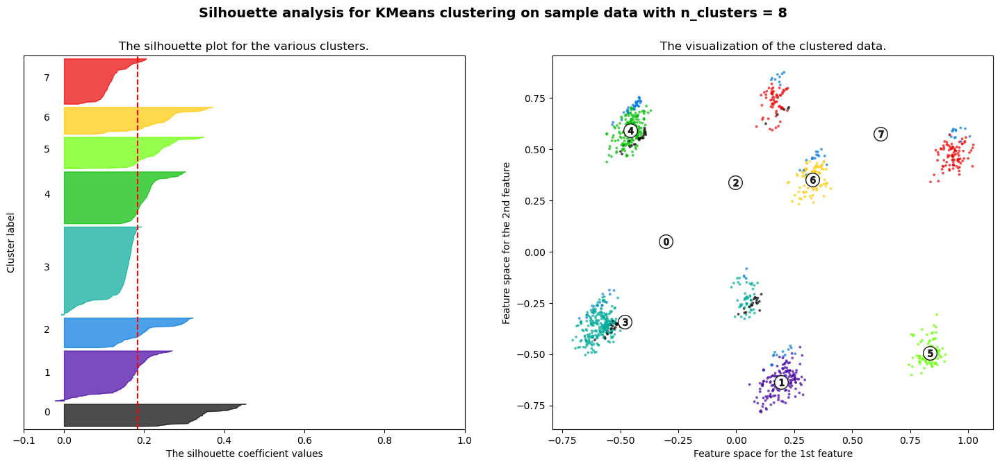

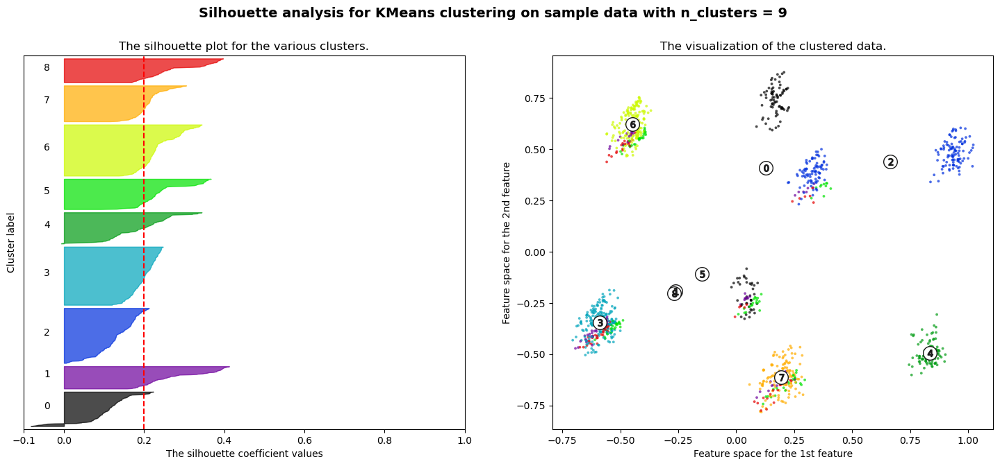

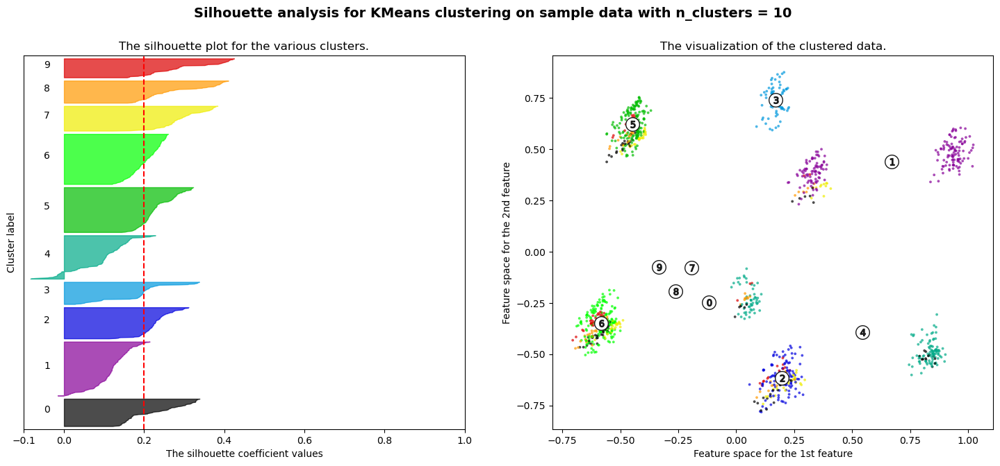

In [147]:
range_n_clusters = [2, 4, 5, 6, 7,8,9,10]
X = X4
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show();

### *MEJORES PCA*
Por orden parece que:   
1) La 1ª: inertias de 1400-600 y silhouette score hasta 0.3   
2) La 4ª: inertias de 2000-1000 y silhouette score hasta 0.25
3) La 3ª: inertias de 2200-1200 y silhouette score hasta 0.17
4) La 4ª: inertias de 2200-1400 y silhouette score hasat 0.18   

Tengo que conprobar a manubrio qué clasificación me convence más.

## PREDICCIONES
### RESULTADO 1ª PCA

In [290]:
kmeans_per_k3

[KMeans(n_clusters=1, random_state=42),
 KMeans(n_clusters=2, random_state=42),
 KMeans(n_clusters=3, random_state=42),
 KMeans(n_clusters=4, random_state=42),
 KMeans(n_clusters=5, random_state=42),
 KMeans(n_clusters=6, random_state=42),
 KMeans(n_clusters=7, random_state=42),
 KMeans(random_state=42),
 KMeans(n_clusters=9, random_state=42),
 KMeans(n_clusters=10, random_state=42),
 KMeans(n_clusters=11, random_state=42)]

In [154]:
kmeans_8 = kmeans_per_k1[7]
y_pred8 = kmeans_8.predict(X1)

np.unique(y_pred8)

array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32)

In [ ]:
 #Titi me pregunto - 7/3/0
# Ojitos Lindos - 7/3/0
#DESPECHÁ - 1/1/1
# Hey Mor - 7/3/0
# As it was - 7/3/0
# Cuff IT - 6/1/4
# unholy - 4/0/2
# Anti-Hero - 1/1/1
# Forget Me - 2/2/0
# Shivers - 1/1/1
# Bizarrap - 4/0/2

In [ ]:
kmeans_8 = kmeans_per_k1[7]
y_pred8 = kmeans_8.predict(X1)

np.unique(y_pred8)

Esto está bien¿?¿?¿?¿?¿?

In [155]:
X_train_plain_sc8 = X_train_plain_sc.copy()
X_train_plain_sc8['target']= y_pred8

In [68]:
kmeans_4 = kmeans_per_k1[3]
y_pred4 = kmeans_4.predict(X1)

np.unique(y_pred4)

array([0, 1, 2, 3], dtype=int32)

In [69]:
X_train_plain_sc4 = X_train_plain_sc.copy()
X_train_plain_sc4['target']= y_pred4

In [245]:
kmeans_5 = kmeans_per_k1[4]
y_pred5 = kmeans_5.predict(X1)

np.unique(y_pred5)

array([0, 1, 2, 3, 4], dtype=int32)

In [246]:
X_train_plain_sc5 = X_train_plain_sc.copy()
X_train_plain_sc5['target']= y_pred5

### RESULTADO 4ª PCA

In [288]:
X_train_sc_sin4[X_train_sc_sin4["danceability"]==0.788]

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,mode,al_type_compilation,al_type_single,exp_False,track_dur_sc,pop_sc,loud_sc,tempo_sc,time_sc,follow_sc,target
223,0.788,0.731,0.0470,0.0615,0.0,0.0997,0.258,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.203211,0.717391,0.787383,0.440992,0.75,0.011504,0
142,0.788,0.859,0.0856,0.2810,0.0,0.0424,0.822,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0.238176,0.608696,0.914923,0.533034,0.75,1.000000,3
173,0.788,0.705,0.1120,0.6170,0.0,0.3010,0.694,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0.102490,0.684783,0.764062,0.263310,0.75,0.000044,1


In [260]:
kmeans4_5 = kmeans_per_k4[4]
y4_pred5 = kmeans4_5.predict(X4)

np.unique(y4_pred5)

array([0, 1, 2, 3, 4], dtype=int32)

In [263]:
X_train_sc_sin5 = X_train_sc_sin.copy()
X_train_sc_sin5['target'] = y4_pred5

In [276]:
kmeans4_4 = kmeans_per_k4[3]
y4_pred4 = kmeans4_4.predict(X4)

np.unique(y4_pred4)

array([0, 1, 2, 3], dtype=int32)

In [277]:
X_train_sc_sin4 = X_train_sc_sin.copy()
X_train_sc_sin4['target'] = y4_pred4

In [ ]:
#Titi me pregunto - 3/0
# Ojitos Lindos - 3/0
#DESPECHÁ - 3/3
# Hey Mor - 3/0
# As it was - 3/0
# Cuff IT - 2/3
# unholy - 1/1
# Anti-Hero - 3/3
# Forget Me - 0/2
# Shivers - 3/3
# Bizarrap - 1/1


### RESULTADO 3ª PCA
Compruebo cómo clasifica las canciones

In [291]:
kmeans3_5 = kmeans_per_k3[4]
y3_pred5 = kmeans3_5.predict(X3)

np.unique(y3_pred5)

array([0, 1, 2, 3, 4], dtype=int32)

In [292]:
X_train_sc5 = X_train_sc.copy()
X_train_sc5['target'] = y3_pred5

In [316]:
X_train_sc4[X_train_sc4["danceability"]==0.788]

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo_confidence,time_signature_confidence,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,key_confidence,mode,mode_confidence,al_type_compilation,al_type_single,exp_False,track_dur_sc,pop_sc,loud_sc,tempo_sc,time_sc,follow_sc,target
223,0.788,0.731,0.0470,0.0615,0.0,0.0997,0.258,0.861,0.995,0,0,0,0,1,0,0,0,0,0,0,0.649,0,0.482,0,0,0,0.203211,0.717391,0.787383,0.440992,0.75,0.011504,2
142,0.788,0.859,0.0856,0.2810,0.0,0.0424,0.822,0.441,1.000,0,0,1,0,0,0,0,0,0,0,0,0.242,1,0.529,0,0,1,0.238176,0.608696,0.914923,0.533034,0.75,1.000000,1
173,0.788,0.705,0.1120,0.6170,0.0,0.3010,0.694,0.176,1.000,0,0,0,0,0,0,1,0,0,0,0,0.151,1,0.335,0,1,1,0.102490,0.684783,0.764062,0.263310,0.75,0.000044,3


In [ ]:
#Titi me pregunto - 4/0
# Ojitos Lindos - 4/0
#DESPECHÁ - 0/1
# Hey Mor - 4/0
# As it was - 4/0
# Cuff IT - 3/1
# unholy - 2/3
# Anti-Hero - 0/1
# Forget Me - 1/0
# Shivers - 0/1
# Bizarrap - 2/3

In [304]:
kmeans3_4 = kmeans_per_k3[3]
y3_pred4 = kmeans3_4.predict(X3)

np.unique(y3_pred4)

array([0, 1, 2, 3], dtype=int32)

In [305]:
X_train_sc4 = X_train_sc.copy()
X_train_sc4['target'] = y3_pred4

### RESULTADO 2ª PCA
Compruebo cómo clasifica las canciones

In [317]:
kmeans2_4 = kmeans_per_k2[3]
y2_pred4 = kmeans2_4.predict(X2)

np.unique(y2_pred4)

array([0, 1, 2, 3], dtype=int32)

In [318]:
X_train_log_sc4 = X_train_log_sc.copy()
X_train_log_sc4['target'] = y2_pred4

In [332]:
X_train_log_sc4[X_train_log_sc4["danceability"]==0.621]

,danceability,energy,acousticness,instrumentalness,valence,tempo_confidence,time_signature_confidence,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,key_confidence,mode,mode_confidence,al_type_compilation,al_type_single,exp_False,track_dur_l_sc,pop_sc,speech_l_sc,live_l_sc,loud_sc,tempo_l_sc,time_sc,follow_sc,target
6,0.621,0.782,0.0125,0.03300,0.550,0.723,0.973,0,0,1,0,0,0,0,0,0,0,0,0.379,1,0.564,0,1,1,0.454052,0.967391,0.179012,0.626613,0.807665,0.600476,0.75,0.085629,2
1380,0.621,0.674,0.2410,0.00182,0.304,0.215,1.000,1,0,0,0,0,0,0,0,0,0,0,0.864,0,0.671,0,1,1,0.407149,0.608696,0.198385,0.444931,0.798967,0.796221,0.75,0.016481,3


In [ ]:
#Titi me pregunto - 1
# Ojitos Lindos - 1
#DESPECHÁ - 0
# Hey Mor - 1
# As it was - 1
# Cuff IT - 0
# unholy - 2
# Anti-Hero - 0
# Forget Me - 3
# Shivers - 0
# Bizarrap -  2

*Conclusión*: de todas las clasificaciones, no me convence  ninguna. Voy a elegir la menos mala para poder continuar con el proyecto, pero en realidad lo ideal sería seguir trabajando en las features y los datos hasta conseguir mejorar un poco la clasificación.   
Tras comprobar todas, me quedo con la que me da de hacer la **1ª PCA** y con **k=4**. Las etiquetas serían:   
- HAPPY: Tití Me Preguntó, Ojitos Lindos, Hey Mor, As it Was   
- BOOSTER: Despechá, Cuff It, Anti-hero, Shivers    
- BAILAR: Unholy, Bzrp+Qvdo    
- SAD: Forget Me

## COMPROBACIÓN ETIQUETAS
Comprobando cómo clasifica el k-means con canciones seleccionadas.

In [326]:
#TITI
X_train[X_train["danceability"]==0.65]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
1217,14,199.604,78,perú,0.78,0.719,0.0506,0.3020,0.000196,0.0931,0.336,-3.613,127.962,0.922,4,0.973,3,0.549,0,0.532,15784982,0,0,0,5.296335,4.851733,0,0,0,1,0,0,0,0,0,0,0,-2.983804,-2.374081
704,1,206.112,65,egipto,0.78,0.590,0.1320,0.4870,0.000011,0.1150,0.660,-7.770,104.977,0.776,4,1.000,3,0.586,0,0.566,2907512,0,1,1,5.328420,4.653741,0,0,0,1,0,0,0,0,0,0,0,-2.024953,-2.162823
1099,1,212.453,64,república_dominicana,0.78,0.525,0.0733,0.3240,0.000006,0.1370,0.842,-7.526,168.049,0.231,4,1.000,5,0.635,0,0.673,526,0,1,0,5.358721,5.124256,0,0,0,0,0,1,0,0,0,0,0,-2.613195,-1.987774
26,16,225.388,93,global,0.78,0.689,0.1410,0.0368,0.000010,0.0698,0.642,-5.668,115.042,0.746,4,0.998,7,0.206,1,0.392,33755306,0,0,0,5.417823,4.745297,0,0,0,0,0,0,0,1,0,0,0,-1.958995,-2.662121
1051,1,181.000,53,kazijistán,0.78,0.637,0.0546,0.2890,0.001230,0.3630,0.317,-7.662,110.025,0.766,4,1.000,10,0.322,0,0.494,11155,0,1,1,5.198497,4.700708,0,0,0,0,0,0,0,0,0,0,1,-2.907721,-1.013352


In [213]:
#OJITOS
X_train[X_train["danceability"]==0.647]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
31,23,258.298,93,global,0.647,0.686,0.0413,0.0800,0.000001,0.5280,0.268,-5.745,79.928,0.161,4,0.988,3,0.304,0,0.333,65270837,0,0,1,5.554114,4.381126,0,0,0,1,0,0,0,0,0,0,0,-3.186893,-0.638659
1361,10,220.962,59,taiwán,0.647,0.473,0.0353,0.7280,0.000000,0.1500,0.227,-6.847,129.961,0.373,4,1.000,6,0.394,0,0.418,24852,0,0,1,5.397991,4.867234,0,0,0,0,0,0,1,0,0,0,0,-3.343872,-1.897120
525,1,197.647,79,argentina,0.647,0.662,0.1250,0.3050,0.000000,0.3590,0.693,-2.955,113.280,0.182,5,0.877,10,0.265,1,0.348,5749546,0,1,1,5.286483,4.729863,0,0,0,0,0,0,0,0,0,0,1,-2.079442,-1.024433
148,15,166.253,85,colombia,0.647,0.801,0.2490,0.0451,0.000000,0.0628,0.517,-2.946,180.108,0.223,4,0.987,1,0.520,0,0.668,3850802,0,0,1,5.113511,5.193557,0,1,0,0,0,0,0,0,0,0,0,-1.390302,-2.767800


In [217]:
#DESPECHÁ
X_train[X_train["danceability"]==0.914]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
19,24,156.787,86,global,0.914,0.622,0.0892,0.1460,0.000017,0.0632,0.770,-6.538,130.04,0.834,4,1.0,7,0.613,1,0.672,6806683,0,0,1,5.054888,4.867842,0,0,0,0,0,0,0,1,0,0,0,-2.416874,-2.761451
1135,13,187.906,74,nigeria,0.914,0.643,0.1340,0.0498,0.000000,0.0618,0.764,-3.929,105.03,0.836,4,1.0,6,0.000,0,0.162,3358687,0,0,1,5.235942,4.654246,0,0,0,0,0,0,1,0,0,0,0,-2.009915,-2.783852


In [220]:
#HEY MOR
X_train[X_train["danceability"]==0.901]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
13,18,196.6,90,global,0.901,0.589,0.289,0.00302,0.000237,0.0992,0.399,-6.713,98.002,0.499,4,1.0,1,0.682,0,0.657,35752986,0,0,1,5.281171,4.584988,0,1,0,0,0,0,0,0,0,0,0,-1.241329,-2.310617


In [222]:
#AS IT WAS
X_train[X_train["danceability"]==0.52]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
5,13,167.303,91,global,0.52,0.731,0.0557,0.342,0.00101,0.311,0.662,-5.338,173.93,0.51,4,1.0,6,0.156,0,0.357,26280801,0,0,1,5.119807,5.158653,0,0,0,0,0,0,1,0,0,0,0,-2.887775,-1.167962


In [224]:
#CUFF IT
X_train[X_train["danceability"]==0.78]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
1217,14,199.604,78,perú,0.78,0.719,0.0506,0.3020,0.000196,0.0931,0.336,-3.613,127.962,0.922,4,0.973,3,0.549,0,0.532,15784982,0,0,0,5.296335,4.851733,0,0,0,1,0,0,0,0,0,0,0,-2.983804,-2.374081
704,1,206.112,65,egipto,0.78,0.590,0.1320,0.4870,0.000011,0.1150,0.660,-7.770,104.977,0.776,4,1.000,3,0.586,0,0.566,2907512,0,1,1,5.328420,4.653741,0,0,0,1,0,0,0,0,0,0,0,-2.024953,-2.162823
1099,1,212.453,64,república_dominicana,0.78,0.525,0.0733,0.3240,0.000006,0.1370,0.842,-7.526,168.049,0.231,4,1.000,5,0.635,0,0.673,526,0,1,0,5.358721,5.124256,0,0,0,0,0,1,0,0,0,0,0,-2.613195,-1.987774
26,16,225.388,93,global,0.78,0.689,0.1410,0.0368,0.000010,0.0698,0.642,-5.668,115.042,0.746,4,0.998,7,0.206,1,0.392,33755306,0,0,0,5.417823,4.745297,0,0,0,0,0,0,0,1,0,0,0,-1.958995,-2.662121
1051,1,181.000,53,kazijistán,0.78,0.637,0.0546,0.2890,0.001230,0.3630,0.317,-7.662,110.025,0.766,4,1.000,10,0.322,0,0.494,11155,0,1,1,5.198497,4.700708,0,0,0,0,0,0,0,0,0,0,1,-2.907721,-1.013352


In [228]:
#UNHOLY
X_train[X_train["danceability"]==0.714]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
1313,1,166.062,70,suecia,0.714,0.732,0.1740,0.6620,0.000000,0.1050,0.720,-5.357,179.951,0.281,4,0.961,0,0.604,0,0.613,28051,0,1,0,5.112361,5.192685,1,0,0,0,0,0,0,0,0,0,0,-1.748700,-2.253795
581,10,133.521,47,bielorrusia,0.714,0.834,0.0970,0.3440,0.000000,0.3000,0.862,-5.935,142.038,0.779,4,0.856,5,0.547,0,0.396,252401,0,0,0,4.894259,4.956095,0,0,0,0,0,1,0,0,0,0,0,-2.333044,-1.203973
248,1,224.146,81,inglaterra,0.714,0.596,0.0430,0.0657,0.000000,0.0625,0.669,-6.206,91.991,0.331,4,0.994,11,0.717,0,0.631,648885,0,1,1,5.412298,4.521691,0,0,0,0,0,0,0,0,0,0,0,-3.146555,-2.772589
609,1,140.307,80,brasil,0.714,0.404,0.4530,0.4570,0.000000,0.0701,0.782,-7.903,130.088,0.032,4,1.000,3,0.532,0,0.340,86101,0,1,1,4.943833,4.868211,0,0,0,1,0,0,0,0,0,0,0,-0.791863,-2.657832
0,1,156.943,100,global,0.714,0.472,0.0864,0.0130,0.000005,0.2660,0.238,-7.384,131.007,0.358,4,1.000,2,0.485,1,0.416,21931185,0,1,1,5.055883,4.875251,0,0,1,0,0,0,0,0,0,0,0,-2.448768,-1.324259
966,14,227.700,59,israel,0.714,0.487,0.0257,0.5620,0.000000,0.0895,0.528,-7.396,100.009,0.506,4,0.986,7,0.579,1,0.746,235933,0,0,1,5.428029,4.605260,0,0,0,0,0,0,0,1,0,0,0,-3.661264,-2.413517
760,16,181.523,54,eslovaquia,0.714,0.721,0.2180,0.0502,0.000000,0.4610,0.654,-7.876,160.005,0.233,4,0.459,5,0.461,0,0.388,349928,0,0,0,5.201382,5.075205,0,0,0,0,0,1,0,0,0,0,0,-1.523260,-0.774357
586,1,173.366,86,brasil,0.714,0.748,0.0679,0.5900,0.000000,0.6260,0.698,-4.605,105.031,0.706,4,0.695,11,0.833,1,0.723,460628,0,1,1,5.155405,4.654256,0,0,0,0,0,0,0,0,0,0,0,-2.689719,-0.468405
742,1,195.047,59,egipto,0.714,0.921,0.0976,0.0574,0.000000,0.2560,0.817,-1.455,99.951,0.324,4,1.000,8,0.583,1,0.491,1935371,0,1,1,5.273241,4.604680,0,0,0,0,0,0,0,0,1,0,0,-2.326878,-1.362578


In [229]:
#ANTI-HERO
X_train[X_train["danceability"]==0.637]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
25,23,250.760,91,global,0.637,0.678,0.2660,0.2090,0.000000,0.1560,0.2540,-3.798,84.039,0.695,4,0.994,0,0.548,1,0.616,66721366,0,0,0,5.524496,4.431281,1,0,0,0,0,0,0,0,0,0,0,-1.324259,-1.857899
38,13,218.270,89,global,0.637,0.398,0.0564,0.0573,0.000001,0.1010,0.0374,-8.290,108.058,0.189,4,0.911,7,0.503,1,0.501,68732645,0,0,0,5.385733,4.682668,0,0,0,0,0,0,0,1,0,0,0,-2.875286,-2.292635
103,1,210.575,90,francia,0.637,0.715,0.0455,0.1480,0.000000,0.0892,0.3080,-4.971,141.872,0.801,4,0.963,2,0.625,0,0.672,12307951,0,1,0,5.349842,4.954925,0,0,1,0,0,0,0,0,0,0,0,-3.090043,-2.416874
981,1,155.219,56,israel,0.637,0.530,0.0336,0.6790,0.000004,0.0997,0.4080,-5.661,140.204,0.514,4,0.395,11,0.485,0,0.604,1031515,0,1,1,5.044837,4.943099,0,0,0,0,0,0,0,0,0,0,0,-3.393229,-2.305590
1,13,200.690,97,global,0.637,0.643,0.0519,0.1300,0.000002,0.1420,0.5330,-6.645,96.888,0.102,4,1.000,4,0.073,1,0.267,68732645,0,0,1,5.301761,4.573556,0,0,0,0,1,0,0,0,0,0,0,-2.958436,-1.951928
317,26,228.615,78,korea_sur,0.637,0.799,0.0338,0.3940,0.000000,0.0921,0.5700,-4.518,104.996,0.362,4,1.000,2,0.519,1,0.576,61771516,0,0,1,5.432039,4.653922,0,0,1,0,0,0,0,0,0,0,0,-3.387294,-2.384880


In [200]:
#FORGET ME
X_train[X_train["danceability"]==0.669]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
140,1,203.472,87,australia,0.669,0.742,0.0441,0.296,0.0000,0.355,0.716,-3.537,203.835,0.054,4,1.000,1,0.194,0,0.434,10577158,0,1,1,5.315528,5.317311,0,1,0,0,0,0,0,0,0,0,0,-3.121295,-1.035637
199,20,237.693,74,italia,0.669,0.737,0.0527,0.404,0.0000,0.182,0.347,-4.603,149.926,0.054,4,0.921,6,0.008,0,0.365,2053229,0,0,0,5.470980,5.010142,0,0,0,0,0,0,1,0,0,0,0,-2.943140,-1.703749
1387,3,163.165,73,turquía,0.669,0.417,0.0655,0.381,0.0981,0.125,0.304,-8.208,83.085,0.213,4,1.000,2,0.079,0,0.205,425249,0,1,1,5.094762,4.419864,0,0,1,0,0,0,0,0,0,0,0,-2.725705,-2.079442
1354,10,175.500,63,taiwán,0.669,0.698,0.0910,0.573,0.0000,0.102,0.286,-4.613,80.003,0.294,4,1.000,11,0.600,1,0.595,309929,0,0,1,5.167639,4.382064,0,0,0,0,0,0,0,0,0,0,0,-2.396896,-2.282782
681,1,255.400,78,dinamarca,0.669,0.843,0.0268,0.169,0.0000,0.195,0.702,-3.766,147.080,0.740,4,1.000,0,0.255,1,0.395,11963739,0,1,1,5.542831,4.990977,1,0,0,0,0,0,0,0,0,0,0,-3.619353,-1.634756


In [204]:
#SHIVERS
X_train[X_train["danceability"]==0.788]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
223,17,188.564,74,italia,0.788,0.731,0.0470,0.0615,0.0,0.0997,0.258,-6.082,127.030,0.861,4,0.995,4,0.649,0,0.482,1266122,0,0,0,5.239437,4.844423,0,0,0,0,1,0,0,0,0,0,0,-3.057608,-2.305590
142,25,207.853,64,australia,0.788,0.859,0.0856,0.2810,0.0,0.0424,0.822,-2.724,141.020,0.441,4,1.000,2,0.242,1,0.529,110047675,0,0,1,5.336831,4.948902,0,0,1,0,0,0,0,0,0,0,0,-2.458070,-3.160607
173,1,133.000,71,colombia,0.788,0.705,0.1120,0.6170,0.0,0.3010,0.694,-6.696,100.023,0.176,4,1.000,6,0.151,1,0.335,4919,0,1,1,4.890349,4.605400,0,0,0,0,0,0,1,0,0,0,0,-2.189256,-1.200645


In [207]:
# BZRP
X_train[X_train["danceability"]==0.621]

,album_total_tracks,track_duration,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers,al_type_compilation,al_type_single,exp_False,track_dur_log,tempo_log,k_0,k_1,k_2,k_3,k_4,k_5,k_6,k_7,k_8,k_9,k_10,speech_log,liveness_log
6,1,198.937,97,global,0.621,0.782,0.0440,0.0125,0.03300,0.230,0.550,-5.548,128.033,0.723,4,0.973,2,0.379,1,0.564,9423370,0,1,1,5.292988,4.852288,0,0,1,0,0,0,0,0,0,0,0,-3.123566,-1.469676
1380,1,180.226,64,turquía,0.621,0.674,0.0472,0.2410,0.00182,0.116,0.304,-5.777,163.917,0.215,4,1.000,0,0.864,0,0.671,1813818,0,1,1,5.194212,5.099360,1,0,0,0,0,0,0,0,0,0,0,-3.053361,-2.154165


In [171]:
df.loc[df["track_duration"]==156.787] 

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
19,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273efc0ef...,MOTOMAMI +,2022-09-09,24,7ltDVBr6mKbRvohxheJ9h1,ROSALÍA,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",156.787,False,53tfEupEzQRtVFOeZvk7xq,DESPECHÁ,86,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.914,0.622,0.0892,0.146,0.000017,0.0632,0.77,-6.538,130.04,0.834,4,1.0,7,0.613,1,0.672,['r&b en espanol'],6806683


In [209]:
df.loc[df["track_name"]=="Tití Me Preguntó"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
12,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b27349d694...,Un Verano Sin Ti,2022-05-06,23,4q3ewBCX7sLwd24euuV69X,Bad Bunny,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",243.716,False,1IHWl5LamUGEuP4ozKQSXZ,Tití Me Preguntó,95,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.65,0.715,0.253,0.0993,0.000291,0.126,0.187,-5.198,106.672,0.326,4,0.544,5,0.053,0,0.301,"['reggaeton', 'trap latino', 'urbano latino']",65270837


In [211]:
df.loc[df["track_name"]=="Ojitos Lindos"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
31,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b27349d694...,Un Verano Sin Ti,2022-05-06,23,4q3ewBCX7sLwd24euuV69X,Bad Bunny,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",258.298,False,3k3NWokhRRkEPhCzPmV8TW,Ojitos Lindos,93,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.647,0.686,0.0413,0.08,0.000001,0.528,0.268,-5.745,79.928,0.161,4,0.988,3,0.304,0,0.333,"['reggaeton', 'trap latino', 'urbano latino']",65270837


In [216]:
df.loc[df["track_name"]=="DESPECHÁ"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
19,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273efc0ef...,MOTOMAMI +,2022-09-09,24,7ltDVBr6mKbRvohxheJ9h1,ROSALÍA,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",156.787,False,53tfEupEzQRtVFOeZvk7xq,DESPECHÁ,86,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.914,0.622,0.0892,0.146,0.000017,0.0632,0.77,-6.538,130.04,0.834,4,1.0,7,0.613,1,0.672,['r&b en espanol'],6806683


In [219]:
df.loc[df["track_name"]=="Hey Mor"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
13,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273125624...,OzuTochi,2022-10-07,18,1i8SpTcr7yvPOmcqrbnVXY,Ozuna,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",196.6,False,1zsPaEkglFvxjAhrM8yhpr,Hey Mor,90,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.901,0.589,0.289,0.00302,0.000237,0.0992,0.399,-6.713,98.002,0.499,4,1.0,1,0.682,0,0.657,"['puerto rican pop', 'reggaeton', 'trap latino...",35752986


In [221]:
df.loc[df["track_name"]=="As It Was"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
5,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b2732e8ed7...,Harry's House,2022-05-20,13,6KImCVD70vtIoJWnq6nGn3,Harry Styles,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",167.303,False,4Dvkj6JhhA12EX05fT7y2e,As It Was,91,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.52,0.731,0.0557,0.342,0.00101,0.311,0.662,-5.338,173.93,0.51,4,1.0,6,0.156,0,0.357,['pop'],26280801


In [223]:
df.loc[df["track_name"]=="CUFF IT"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
26,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b2730e58a0...,RENAISSANCE,2022-07-29,16,6vWDO969PvNqNYHIOW5v0m,Beyoncé,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",225.388,True,1xzi1Jcr7mEi9K2RfzLOqS,CUFF IT,93,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.78,0.689,0.141,0.0368,0.00001,0.0698,0.642,-5.668,115.042,0.746,4,0.998,7,0.206,1,0.392,"['dance pop', 'pop', 'r&b']",33755306


In [226]:
df.loc[df["track_name"]=="Unholy (feat. Kim Petras)"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
0,2022-11-25T11:45:12Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273a935e4...,Unholy (feat. Kim Petras),2022-09-22,1,2wY79sveU1sp5g7SokKOiI,Sam Smith,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",156.943,False,3nqQXoyQOWXiESFLlDF1hG,Unholy (feat. Kim Petras),100,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.714,0.472,0.0864,0.013,0.000005,0.266,0.238,-7.384,131.007,0.358,4,1.0,2,0.485,1,0.416,"['pop', 'uk pop']",21931185


In [227]:
df.loc[df["track_name"]=="Anti-Hero"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
1,2022-11-25T11:45:12Z,album,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273bb54dd...,Midnights,2022-10-21,13,06HL4z0CvFAxyc27GXpf02,Taylor Swift,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",200.69,False,0V3wPSX9ygBnCm8psDIegu,Anti-Hero,97,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.637,0.643,0.0519,0.13,0.000002,0.142,0.533,-6.645,96.888,0.102,4,1.0,4,0.073,1,0.267,['pop'],68732645


In [199]:
df.loc[df["track_name"]=="Forget Me"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
140,2022-11-25T11:45:11Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b273711fab...,Forget Me,2022-09-09,1,4GNC7GD6oZMSxPGyXy4MNB,Lewis Capaldi,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",203.472,False,5uSFGgIfHMT3osrAd9n9ym,Forget Me,87,https://open.spotify.com/playlist/37i9dQZEVXbK...,australia,0.669,0.742,0.0441,0.296,0.0,0.355,0.716,-3.537,203.835,0.054,4,1.0,1,0.194,0,0.434,"['pop', 'uk pop']",10577158


In [203]:
df.loc[df["track_name"]=="Shivers"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
142,2022-11-25T11:45:11Z,album,['GB'],https://i.scdn.co/image/ab67616d0000b2735a1aec...,= (Tour Edition),2020,25,6eUKZXaKkcviH0Ku9w2n3V,Ed Sheeran,['GB'],207.853,False,3xWGA8pa0IKFI7IMPri4P0,Shivers,64,https://open.spotify.com/playlist/37i9dQZEVXbK...,australia,0.788,0.859,0.0856,0.281,0.0,0.0424,0.822,-2.724,141.02,0.441,4,1.0,2,0.242,1,0.529,"['pop', 'uk pop']",110047675


In [206]:
df.loc[df["track_name"]=="Quevedo: Bzrp Music Sessions, Vol. 52"]

,added_at,album_type,album_avb_mkt,album_image,album_name,album_release_date,album_total_tracks,artist_id,artist,available_mkt,track_duration,explicit,track_id,track_name,popularity,playlist_link,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_genres,artist_followers
6,2022-11-25T11:45:12Z,single,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://i.scdn.co/image/ab67616d0000b2731630dd...,"Quevedo: Bzrp Music Sessions, Vol. 52",2022-07-06,1,716NhGYqD1jl2wI1Qkgq36,Bizarrap,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",198.937,False,2tTmW7RDtMQtBk7m2rYeSw,"Quevedo: Bzrp Music Sessions, Vol. 52",97,https://open.spotify.com/playlist/37i9dQZEVXbN...,global,0.621,0.782,0.044,0.0125,0.033,0.23,0.55,-5.548,128.033,0.723,4,0.973,2,0.379,1,0.564,"['argentine hip hop', 'pop venezolano', 'trap ...",9423370


## DATASET
Una vez escogido el clustering, añado las prediccionas al df de X_train.  
Tengo que hacer el mismo procesado para Test.  
Pruebo los diferentes modelos con X_train (cross validation), una vez escogio el que mejor funciona - TEST. Y por último juntar todos los datos (TRAIN Y TEST) y aplicar el .fit con ellos, si no me estaría dejando por el camino mi 20% de los datos para entrenar.

In [340]:
X_train_plain_sc4
df_process = X_train_plain_sc4.copy()
df_process.to_csv('train_procesado.csv', index=False)

In [346]:
df_PCA = pd.DataFrame(X_train_plain_pca, index=df_process.index)
df_PCA['target'] = y_pred4
df_PCA.to_csv('train_proces_PCA.csv', index=False)

In [345]:
df_process

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo_confidence,time_signature_confidence,key_confidence,mode,mode_confidence,al_type_compilation,al_type_single,exp_False,track_dur_sc,pop_sc,loud_sc,tempo_sc,time_sc,key_sc,follow_sc,target
654,0.811,0.889,0.0617,0.1710,0.000350,0.1340,0.870,0.280,1.000,0.570,1,0.650,0,1,1,0.196772,0.717391,0.847469,0.223716,0.75,1.000000,0.002852,0
1338,0.616,0.690,0.0338,0.6710,0.000000,0.3680,0.446,0.473,0.345,0.577,1,0.577,0,1,1,0.317296,0.619565,0.821300,0.368200,0.75,0.363636,0.000236,0
254,0.718,0.655,0.0751,0.1870,0.000000,0.4980,0.569,0.397,1.000,0.474,0,0.407,1,0,1,0.248593,0.706522,0.774583,0.263237,0.75,0.727273,0.002456,3
1070,0.925,0.650,0.1550,0.0569,0.006310,0.0917,0.923,0.909,1.000,0.222,1,0.333,0,1,1,0.261516,0.467391,0.765164,0.506928,0.75,0.545455,0.003250,0
1280,0.777,0.805,0.1390,0.1140,0.000001,0.1140,0.578,0.140,1.000,0.525,0,0.540,0,1,1,0.219106,0.510870,0.807703,0.789448,0.75,0.909091,0.002305,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.357,0.425,0.0333,0.5840,0.000000,0.3220,0.270,0.055,0.545,0.463,1,0.551,0,0,1,0.220388,0.858696,0.741084,0.276830,0.50,0.454545,0.069242,1
1294,0.416,0.762,0.0279,0.3120,0.804000,0.0559,0.461,0.438,0.931,0.476,1,0.549,0,0,1,0.453229,0.815217,0.737894,0.236625,0.75,0.181818,0.057879,1
860,0.427,0.444,0.0287,0.6850,0.000000,0.1120,0.595,0.141,0.969,0.711,1,0.689,0,1,1,0.249262,0.532609,0.750807,0.593799,0.75,0.090909,0.000334,0
1459,0.658,0.451,0.0410,0.5310,0.000034,0.1220,0.472,0.059,1.000,0.660,1,0.650,0,1,1,0.330288,0.554348,0.725132,0.788580,0.75,0.545455,0.000220,0


## PROCESADO TEST

In [5]:
X_test

,album_type,album_total_tracks,track_duration,explicit,popularity,country,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,loudness,tempo,tempo_confidence,time_signature,time_signature_confidence,key,key_confidence,mode,mode_confidence,artist_followers
1192,album,14,255.764,False,47,pakistán,0.705,0.493,0.0552,0.2830,0.000688,0.1250,0.794,-7.120,149.957,0.861,4,1.000,4,0.636,1,0.532,21346
184,album,13,191.039,False,85,eeuu,0.662,0.357,0.1540,0.5530,0.001290,0.0837,0.124,-14.132,125.960,0.843,4,0.923,4,0.301,1,0.305,68732645
1220,single,1,189.000,False,75,polonia,0.419,0.292,0.0684,0.6550,0.000000,0.1060,0.270,-10.349,197.158,0.138,3,1.000,8,0.614,1,0.603,1821200
67,album,15,222.857,False,73,españa,0.845,0.776,0.0488,0.1110,0.032100,0.0684,0.528,-3.098,105.018,0.783,4,1.000,11,0.338,0,0.440,3168395
220,album,23,182.338,True,63,italia,0.630,0.748,0.0802,0.0279,0.000000,0.2140,0.906,-4.497,92.938,0.455,4,1.000,10,0.404,1,0.329,1955744
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567,single,1,177.346,False,65,bielorrusia,0.527,0.861,0.0388,0.0155,0.031100,0.2760,0.387,-6.730,77.498,0.027,4,0.949,8,0.239,1,0.405,64909
560,album,12,137.115,True,56,bielorrusia,0.743,0.807,0.2870,0.1440,0.000032,0.1080,0.434,-4.804,156.052,0.234,4,0.859,2,0.000,0,0.280,1079604
943,album,12,219.040,True,73,indonesia,0.873,0.488,0.0413,0.5310,0.000132,0.1530,0.462,-8.285,119.983,0.801,4,1.000,7,0.057,0,0.208,2353657
522,album,12,85.430,True,73,argentina,0.925,0.714,0.0502,0.0150,0.000136,0.1200,0.360,-6.725,118.935,0.763,4,1.000,1,0.145,1,0.516,1666894


#### Tranformamos variables cat

In [6]:
# One hot col album_type
X_test = pd.get_dummies(X_test, columns = ["album_type"], prefix = ["al_type"])
X_test.drop(columns=("al_type_album"),axis=1, inplace=True) #correlación

In [7]:
# Tratamos col explicit
X_test = pd.get_dummies(X_test, columns = ["explicit"], prefix = ["exp"])
X_test.drop(columns=("exp_True"),axis=1, inplace=True) # eliminamos por correlación

In [8]:
X_test.columns

Index(['album_total_tracks', 'track_duration', 'popularity', 'country',
       'danceability', 'energy', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'loudness', 'tempo',
       'tempo_confidence', 'time_signature', 'time_signature_confidence',
       'key', 'key_confidence', 'mode', 'mode_confidence', 'artist_followers',
       'al_type_compilation', 'al_type_single', 'exp_False'],
      dtype='object')

In [9]:
X_test_plain = X_test.copy()
X_test_plain = X_test_plain[['track_duration', 'popularity',
                                'danceability', 'energy', 'speechiness', 'acousticness',
                                'instrumentalness', 'liveness', 'valence', 'loudness', 'tempo',
                                'tempo_confidence', 'time_signature', 'time_signature_confidence',
                                'key', 'key_confidence', 'mode', 'mode_confidence', 'artist_followers',
                                'al_type_compilation', 'al_type_single', 'exp_False']]
X_test_plain.to_csv("test_set_plain.csv", index=False)

In [33]:
## Para plain
track_dur_sc = scaler.fit_transform(X_test_plain[["track_duration"]])
pop_sc = scaler.fit_transform(X_test_plain[["popularity"]])
loud_sc = scaler.fit_transform(X_test_plain[["loudness"]])
tempo_sc = scaler.fit_transform(X_test_plain[["tempo"]])
time_sc = scaler.fit_transform(X_test_plain[["time_signature"]])
key_sc = scaler.fit_transform(X_test_plain[["key"]])
follow_sc = scaler.fit_transform(X_test_plain[["artist_followers"]])

X_test_plain_sc = X_test_plain.copy()
X_test_plain_sc=X_test_plain_sc.assign(track_dur_sc=track_dur_sc,pop_sc=pop_sc,loud_sc=loud_sc,tempo_sc=tempo_sc,time_sc=time_sc,key_sc=key_sc,follow_sc=follow_sc)
X_test_plain_sc.drop(columns=(['track_duration','popularity','loudness','tempo','time_signature','key','artist_followers']),axis=1, inplace=True)

In [34]:
X_test_plain_sc

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo_confidence,time_signature_confidence,key_confidence,mode,mode_confidence,al_type_compilation,al_type_single,exp_False,track_dur_sc,pop_sc,loud_sc,tempo_sc,time_sc,key_sc,follow_sc
1192,0.705,0.493,0.0552,0.2830,0.000688,0.1250,0.794,0.861,1.000,0.636,1,0.532,0,0,1,0.655835,0.347222,0.615007,0.611889,0.75,0.363636,0.000281
184,0.662,0.357,0.1540,0.5530,0.001290,0.0837,0.124,0.843,0.923,0.301,1,0.305,0,0,1,0.418189,0.875000,0.069199,0.443175,0.75,0.363636,0.949466
1220,0.419,0.292,0.0684,0.6550,0.000000,0.1060,0.270,0.138,1.000,0.614,1,0.603,0,1,1,0.410702,0.736111,0.363665,0.943741,0.50,0.727273,0.025144
67,0.845,0.776,0.0488,0.1110,0.032100,0.0684,0.528,0.783,1.000,0.338,0,0.440,0,0,1,0.535013,0.708333,0.928077,0.295940,0.75,1.000000,0.043754
220,0.630,0.748,0.0802,0.0279,0.000000,0.2140,0.906,0.455,1.000,0.404,1,0.329,0,0,0,0.386242,0.569444,0.819180,0.211010,0.75,0.909091,0.027003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567,0.527,0.861,0.0388,0.0155,0.031100,0.2760,0.387,0.027,0.949,0.239,1,0.405,0,1,1,0.367913,0.597222,0.645365,0.102457,0.75,0.727273,0.000882
560,0.743,0.807,0.2870,0.1440,0.000032,0.1080,0.434,0.234,0.859,0.000,0,0.280,0,0,0,0.220199,0.472222,0.795283,0.654740,0.75,0.181818,0.014899
943,0.873,0.488,0.0413,0.5310,0.000132,0.1530,0.462,0.801,1.000,0.057,0,0.208,0,0,0,0.520998,0.708333,0.524325,0.401153,0.75,0.636364,0.032499
522,0.925,0.714,0.0502,0.0150,0.000136,0.1200,0.360,0.763,1.000,0.145,1,0.516,0,0,0,0.030431,0.708333,0.645754,0.393785,0.75,0.090909,0.023012


#### Hago PCA tb a test
¿Cómo hago esto? Porque claro, al hacer la PCA los datos diferentes, con lo que me pone diferentes PCAs (una más), y para hacer el kmeans, complicado

In [39]:
pca1.components_

array([[ 1.14565376e-01,  8.68301031e-02,  5.19814777e-02,
        -1.95725499e-01, -1.58105404e-03,  4.47589256e-03,
         4.46218815e-02,  2.00948312e-01,  3.60011826e-02,
        -3.29432325e-02, -2.81121737e-01, -6.44929940e-02,
         5.37128831e-03, -7.68480127e-01, -4.53534722e-01,
        -5.95777729e-02, -3.17152733e-02,  6.96760425e-02,
        -3.00178882e-02,  2.27145129e-02, -1.33969262e-02,
         5.54062542e-02],
       [-4.94294781e-02, -3.70003906e-02, -6.02037287e-03,
         4.32799540e-02,  4.28145336e-04, -2.00310346e-02,
        -7.02956915e-02, -1.89807878e-02, -3.24983959e-03,
         6.58689477e-02,  9.20488885e-01,  4.01506497e-02,
         1.54200017e-02, -3.14110338e-01, -1.04608929e-01,
         4.54185858e-02,  5.43097246e-02, -2.37015659e-02,
        -5.03997388e-03, -1.11874033e-02, -1.20543272e-01,
         7.21974287e-02],
       [ 9.84828962e-02,  9.96574362e-02,  6.61168249e-02,
        -1.79539458e-01,  1.28749564e-03,  4.09375056e-02,
    

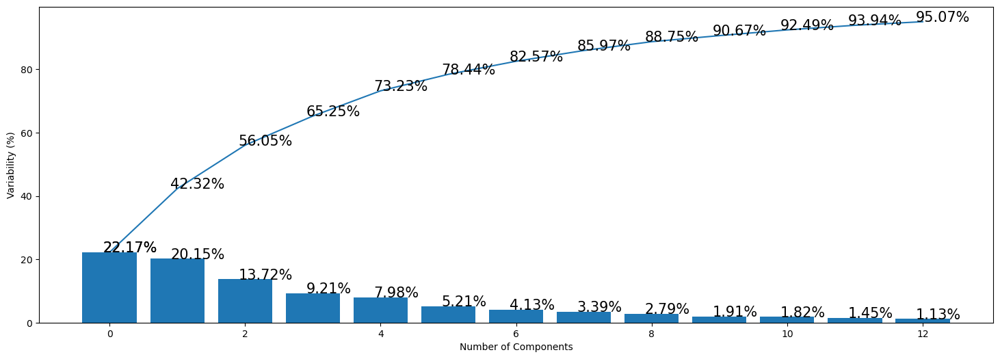

In [44]:
# Aplicación de PCA conservando el 95% de la varianza
#pca1 = PCA(n_components=0.95)
X_test_plain_pca = pca1.transform(X_test_plain_sc)

# Representación de la varianza explicada por cada componente
pca1.components_ 
pca_importance(pca1)

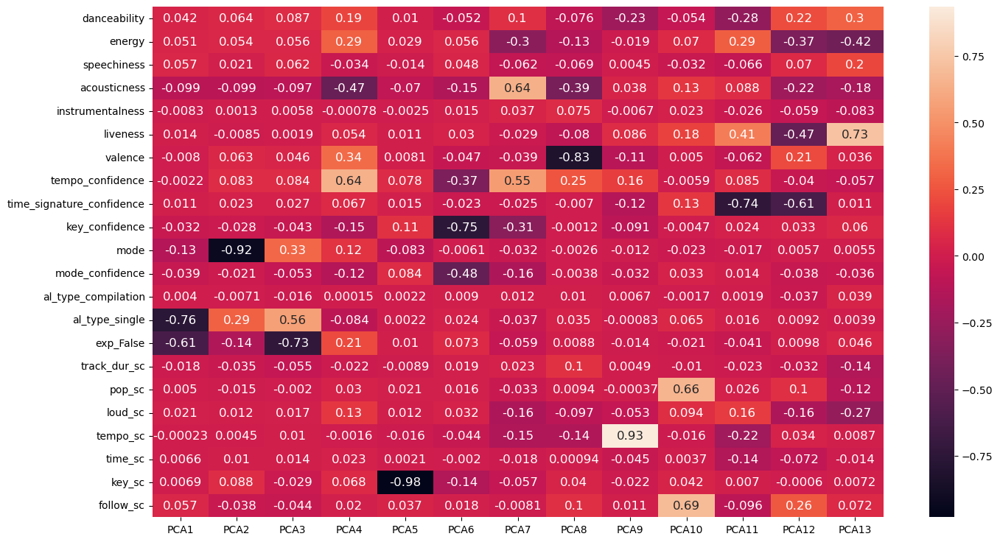

In [45]:
# Sacamos la matriz de pesos del PCA
component_names = ['PCA{}'.format(i) for i in range(1, pca1.components_.shape[0] + 1)]
loadings = pd.DataFrame(
                            pca1.components_.T,  # transpose the matrix of loadings
                            columns=component_names,  # so the columns are the principal components
                            index=X_test_plain_sc.columns,  # and the rows are the original features
                        )
fig, ax = plt.subplots(1,1, figsize=(16, 9))
sns.heatmap(loadings, annot=True, ax=ax, annot_kws={"size": 12});

In [50]:
pca1

PCA(n_components=0.95)

In [53]:
#GUARDAR PCA
with open("pca_model.pkl", "wb") as file:
    pickle.dump(pca1, file)

In [58]:
def cargar_modelo(path):
    with open(path, "rb") as file:
        model = pickle.load(file)
    return model

In [59]:
cargar_modelo('/Users/gabrielarodrigocastrillo/Desktop/The_Bridge/Data_Science/COPIA_Repositorio/03-Machine_Learning/Proyecto_ML/SRC/pca_model.pkl')

PCA(n_components=0.95)

#### KMEANS a test

In [71]:
X = X_test_plain_pca
y_test_pred4 = kmeans_4.predict(X)

X_test_plain_sc4 = X_test_plain_sc.copy()
X_test_plain_sc4['target']= y_test_pred4

NameError: name 'X_test_plain_pca' is not defined

In [55]:
np.unique(y_test_pred4)

array([0, 1, 2, 3], dtype=int32)

In [70]:
kmeans_4

KMeans(n_clusters=4, random_state=42)

In [72]:
## GUARDAR KMEANS
with open("kmeans_model.pkl", "wb") as file:
    pickle.dump(kmeans_4, file)

In [50]:
X_test_plain_sc4

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo_confidence,time_signature_confidence,key_confidence,mode,mode_confidence,al_type_compilation,al_type_single,exp_False,track_dur_sc,pop_sc,loud_sc,tempo_sc,time_sc,key_sc,follow_sc,target
1192,0.705,0.493,0.0552,0.2830,0.000688,0.1250,0.794,0.861,1.000,0.636,1,0.532,0,0,1,0.655835,0.347222,0.615007,0.611889,0.75,0.363636,0.000281,1
184,0.662,0.357,0.1540,0.5530,0.001290,0.0837,0.124,0.843,0.923,0.301,1,0.305,0,0,1,0.418189,0.875000,0.069199,0.443175,0.75,0.363636,0.949466,1
1220,0.419,0.292,0.0684,0.6550,0.000000,0.1060,0.270,0.138,1.000,0.614,1,0.603,0,1,1,0.410702,0.736111,0.363665,0.943741,0.50,0.727273,0.025144,0
67,0.845,0.776,0.0488,0.1110,0.032100,0.0684,0.528,0.783,1.000,0.338,0,0.440,0,0,1,0.535013,0.708333,0.928077,0.295940,0.75,1.000000,0.043754,3
220,0.630,0.748,0.0802,0.0279,0.000000,0.2140,0.906,0.455,1.000,0.404,1,0.329,0,0,0,0.386242,0.569444,0.819180,0.211010,0.75,0.909091,0.027003,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567,0.527,0.861,0.0388,0.0155,0.031100,0.2760,0.387,0.027,0.949,0.239,1,0.405,0,1,1,0.367913,0.597222,0.645365,0.102457,0.75,0.727273,0.000882,0
560,0.743,0.807,0.2870,0.1440,0.000032,0.1080,0.434,0.234,0.859,0.000,0,0.280,0,0,0,0.220199,0.472222,0.795283,0.654740,0.75,0.181818,0.014899,3
943,0.873,0.488,0.0413,0.5310,0.000132,0.1530,0.462,0.801,1.000,0.057,0,0.208,0,0,0,0.520998,0.708333,0.524325,0.401153,0.75,0.636364,0.032499,3
522,0.925,0.714,0.0502,0.0150,0.000136,0.1200,0.360,0.763,1.000,0.145,1,0.516,0,0,0,0.030431,0.708333,0.645754,0.393785,0.75,0.090909,0.023012,1


#### Guardo datasets

In [51]:
test_process = X_test_plain_sc4.copy()
test_process.to_csv('test_procesado.csv', index=False)

In [53]:
test_PCA = pd.DataFrame(X_test_plain_pca, index=test_process.index)
test_PCA['target'] = y_test_pred4
test_PCA.to_csv('test_proces_PCA.csv', index=False)

In [54]:
test_PCA

,0,1,2,3,4,5,6,7,8,9,10,11,12,target
1192,0.158302,-0.603533,-0.384577,0.408008,0.132305,-0.293867,0.201420,-0.096266,0.189740,-0.334511,-0.202330,0.056018,0.048975,1
184,0.201371,-0.712022,-0.464958,0.036178,0.088836,0.078114,0.649489,0.524975,0.206405,0.618636,-0.265009,0.362337,0.181561,1
1220,-0.656653,-0.440991,0.013240,-0.606256,-0.311296,-0.114835,0.007147,0.066486,0.535583,0.041736,-0.229794,0.043822,0.056146,0
67,0.354910,0.403941,-0.681378,0.492077,-0.415955,-0.006232,0.078411,0.170427,-0.127257,-0.003186,-0.049001,-0.032854,-0.172029,3
220,0.840593,-0.388075,0.369059,0.296715,-0.442911,0.057273,-0.128109,-0.200471,-0.233891,-0.096098,0.028603,-0.018949,-0.031935,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567,-0.534453,-0.323887,0.140185,-0.025289,-0.298142,0.465047,-0.393030,0.185010,-0.305324,-0.051855,0.120360,-0.145728,0.010050,0
560,0.988671,0.446085,0.066057,-0.144805,0.264316,0.562654,-0.026224,-0.037709,0.249285,-0.215091,-0.013957,0.011285,-0.074834,3
943,0.921355,0.466204,0.023128,-0.002583,-0.161844,0.196258,0.699231,0.092234,0.079622,-0.003687,-0.117772,-0.007526,-0.005813,3
522,0.851573,-0.437717,0.435422,0.308446,0.369226,0.149513,0.183838,0.248292,0.012921,-0.090537,-0.104642,0.018243,0.014850,1
